# DenseDepth - Depth Map Creation

In [1]:
! nvidia-smi

Mon May 25 02:38:01 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
from zipfile import ZipFile

def extract_zip(filename):
    try:
        with ZipFile(filename, 'r') as zip:
            print("Extracting all the files now")
            zip.extractall()
            print("Done!")
    except:
        print("THIS FILE DOESNT EXIST")

In [5]:
extract_zip("/content/gdrive/My Drive/Mask_Rcnn/allinone")

Extracting all the files now
Done!


In [6]:
extract_zip("/content/gdrive/My Drive/Mask_Rcnn/bg.zip")

Extracting all the files now
Done!


In [0]:
%mv /content/bg/ /content/content/data_all

In [8]:
from __future__ import print_function
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
from tqdm import tqdm
from PIL import Image
from tqdm import tqdm_notebook
import matplotlib.pyplot as plt
import cv2
import pkgutil
import importlib
import os
%matplotlib inline
%config IPCompleter.greedy=True
%reload_ext autoreload
import seaborn as sns
import io
import skimage
from skimage.transform import resize
from itertools import groupby
from tqdm.auto import tqdm
from pathlib import Path
from time import time
from datetime import datetime 
import gc
sns.set()
from zipfile import ZipFile
import zipfile

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
import torchvision
import matplotlib.pyplot as plt

def show(tensors, figsize= (10,10), *args, **kwargs):
  try:
    tensors = tensors.detach().cpu()
  except:
    pass
  grid_tensor = torchvision.utils.make_grid(tensors, *args, **kwargs)  
  grid_image  = grid_tensor.permute(1, 2, 0)
  plt.figure(figsize = figsize)
  plt.imshow(grid_image)
  plt.xticks([])  
  plt.yticks([])
  plt.show()

In [0]:
from pathlib import Path
import os
from torch.utils.data import Dataset
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
import numpy as np
from PIL import Image
import PIL
import zipfile
from zipfile import ZipFile
from zipfile import ZipFile as zip

sns.set()


class DenseDepth(Dataset):

    bg_stat = (['0.445187151432037', '0.453919172286987', '0.442775547504425'], 
               ['0.209829792380333', '0.204434618353844', '0.218459352850914'])
    fg_bg_stat = (['0.458231598138809', '0.458402276039124', '0.454385221004486'], 
                  ['0.216196656227112', '0.213248178362846', '0.224730432033539'])
    fg_bg_mask_stat = (['0.246712774038315', '0.246712774038315', '0.246712774038315'], 
                       ['0.419586002826691', '0.419586002826691', '0.419586002826691'])
    depth_fg_bg_stat = (['0.180530488491058', '0.180530488491058', '0.180530488491058'], 
                        ['0.051506847143173', '0.051506847143173', '0.051506847143173'])

    def __init__(self, root, train=True, transform=None, target_transform=None):
        self.root = Path(root) / 'data_all'
        self.root.mkdir(parents=True, exist_ok=True)
        self.transform = transform
        self.target_transform = target_transform

        # check if the dataset exists
        if os.path.isdir(self.root / 'bg') or os.path.isdir(self.root / 'fg_bg') or os.path.isdir(self.root / 'fg_bg_mask') or os.path.isdir(self.root / 'fg_bg_depth'):
            print(f'dataset folders/files already exists in {self.root}')

        # pathlib does not order them by default
        bg_paths = sorted(list(Path(self.root / 'bg').glob('*.jpg')))
        fg_bg_paths = sorted(list(Path(self.root / 'fg_bg').glob('**/*.jpg')))
        fg_bg_mask_paths = sorted(
            list(Path(self.root / 'fg_bg_mask').glob('**/*.jpg')))
        depth_fg_bg_paths = sorted(
            list(Path(self.root / 'fg_bg_depth').glob('**/*.png')))

        assert(len(bg_paths) == 100)
        assert(len(fg_bg_paths) == 400000)
        assert(len(fg_bg_mask_paths) == 400000)
        assert(len(depth_fg_bg_paths) == 400000)

        print(f'found {len(bg_paths)} bg images, {len(fg_bg_paths)} fg_bg images, {len(fg_bg_mask_paths)} fg_bg_mask images, {len(depth_fg_bg_paths)} depth_fg_bg images')

        self.input_paths = fg_bg_paths
        self.bg_paths = bg_paths
        self.target_paths_mask = fg_bg_mask_paths
        self.target_paths_depth = depth_fg_bg_paths

    def __getitem__(self, index):

        bgidx = self.input_paths[index].stem.split('_')[3]

        bgimg = Image.open(self.bg_paths[int(bgidx)])
        bgimg = bgimg.convert('RGB')
        # bgimg = np.array(bgimg)

        fg_bgimg = Image.open(self.input_paths[index])
        fg_bgimg = fg_bgimg.convert('RGB')
        # fg_bgimg = np.array(fg_bgimg)

        target_mask = self.target_paths_mask[index]
        target_depth = self.target_paths_depth[index]

        mask_fg_bgimg = Image.open(target_mask)
        mask_fg_bgimg.convert('L')
        mask_arr = np.array(mask_fg_bgimg)
        mask_arr[mask_arr >= 150] = 255
        mask_arr[mask_arr < 150] = 0
        mask_fg_bgimg = Image.fromarray(mask_arr)
        # mask_fg_bgimg.convert('L')

        
        depth_fg_bgimg = Image.open(target_depth)
        depth_fg_bgimg.convert('L')

        if self.transform is not None:
            bgimg = self.transform(bgimg)
            fg_bgimg = self.transform(fg_bgimg)

        if self.target_transform is not None:
            mask_fg_bgimg = self.target_transform(mask_fg_bgimg)
            depth_fg_bgimg = self.target_transform(depth_fg_bgimg)

        return {'bg': bgimg, 'fg_bg': fg_bgimg, 'fg_bg_mask': mask_fg_bgimg, 'depth_fg_bg': depth_fg_bgimg}

    def __len__(self):
        return len(self.input_paths)

    @staticmethod
    def plot_sample(sample):
        '''
        Plots a given sample of the dataset
        '''
        bg, fg_bg, fg_bg_mask, depth_fg_bg = sample['bg'].permute(1, 2, 0).numpy(), sample['fg_bg'].permute(
            1, 2, 0).numpy(), sample['fg_bg_mask'][0].numpy(), sample['depth_fg_bg'][0].numpy()
        fig, ax = plt.subplots(2, 2, figsize=(4, 4), sharex=True, sharey=True)

        ax[0, 0].imshow(bg)
        ax[0, 0].axis('off')

        ax[0, 1].imshow(fg_bg)
        ax[0, 1].axis('off')

        ax[1, 0].imshow(fg_bg_mask)
        ax[1, 0].axis('off')

        ax[1, 1].imshow(depth_fg_bg)
        ax[1, 1].axis('off')

        fig.tight_layout()

        plt.show()

    @staticmethod
    def plot4_batch(batch):
        '''
        Plots 4 images for batch
        '''
        fig, ax = plt.subplots(4, 4, figsize=(6, 6), sharex=True, sharey=True)

        # set the title
        for axs, col in zip(ax[0], ['BG', 'FG_BG', 'FG_BG_MASK', 'DEPTH_FG_BG']):
            axs.set_title(col)

        # plot the first 4 samples from the batch
        for i in range(4):
            bg, fg_bg, fg_bg_mask, depth_fg_bg = batch['bg'][i].permute(1, 2, 0).numpy(), batch['fg_bg'][i].permute(
                1, 2, 0).numpy(), batch['fg_bg_mask'][i][0].numpy(), batch['depth_fg_bg'][i][0].numpy()

            ax[i, 0].imshow(bg)
            ax[i, 0].axis('off')

            ax[i, 1].imshow(fg_bg)
            ax[i, 1].axis('off')

            ax[i, 2].imshow(fg_bg_mask)
            ax[i, 2].axis('off')

            ax[i, 3].imshow(depth_fg_bg)
            ax[i, 3].axis('off')

        fig.tight_layout()

        plt.show()

In [0]:
import torch


class Dataloader(object):

    def __init__(self, traindataset, batch_size=64):
        self.traindataset = traindataset
        #self.testdataset = testdataset

        # number of subprocesses to use for data loading
        self.num_workers = 0
        # how many samples per batch to load
        self.batch_size = 64
        # percentage of training set to use as validation
        # valid_size = 0.2

        seed = 1
        # For reproducibility
        torch.manual_seed(seed)

        cuda = torch.cuda.is_available()
        print("CUDA Available?", cuda)

        if cuda:
            self.batch_size = batch_size
            self.num_workers = 4
            self.pin_memory = True
        else:
            self.shuffle = True
            self.batch_size = batch_size

        print(self.batch_size)

    def gettraindataloader(self):
        return torch.utils.data.DataLoader(dataset=self.traindataset, batch_size=self.batch_size,
                                           num_workers=self.num_workers, shuffle=True, pin_memory=True)

    # def gettestdataloader(self):
    #     return torch.utils.data.DataLoader(dataset=self.testdataset, batch_size=self.batch_size,
    #                                        num_workers=self.num_workers, shuffle=True, pin_memory=True)

In [0]:
train_transforms = transforms.Compose([transforms.Resize((256,256)),
                                       transforms.ColorJitter(brightness = (0.8, 1.2)
                                       contrast = (0.8, 1.2)
                                       saturation = (0.8, 1.2)
                                       hue = (-0.1, 0.1)),
                                       transforms.ToTensor(),
                                       ])

transforms = transforms.Compose([transforms.Resize((256,256)),
                                       transforms.ColorJitter(saturation=0.1,hue=0.1),
                                       transforms.ToTensor(),
                                       ])

In [34]:
train_ds = DenseDepth('/content/content', transform = train_transforms, target_transform = transforms)

dataset folders/files already exists in /content/content/data_all
found 100 bg images, 400000 fg_bg images, 400000 fg_bg_mask images, 400000 depth_fg_bg images


In [35]:
batch_size = 16

dataloader = Dataloader(traindataset=train_ds, batch_size=batch_size)
train_loader = dataloader.gettraindataloader()


CUDA Available? True
16


In [0]:
import torch
import torch.nn as nn

class ResDoubleConv(nn.Module):
    '''Basic DoubleConv of a ResNetV2'''

    def __init__(self, in_channels, out_channels):
        super(ResDoubleConv, self).__init__()

        self.double_conv = nn.Sequential(
            nn.BatchNorm2d(in_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels,
                      kernel_size=3, padding=1, bias=False)
        )

    def forward(self, x):
        out = self.double_conv(x)

        return out


class ResDownBlock(nn.Module):
    '''Basic DownBlock of a ResNetV2'''

    def __init__(self, in_channels, out_channels):
        super(ResDownBlock, self).__init__()

        self.double_conv = ResDoubleConv(in_channels, out_channels)

        self.proj_layer = nn.Sequential(
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=1, stride=1, bias=False),
            nn.BatchNorm2d(out_channels)
        )

        self.down_sample = nn.MaxPool2d(2)

    def forward(self, input):
        identity = self.proj_layer(input)
        out = self.double_conv(input)
        out = out + identity

        return self.down_sample(out), out


class ResUpBlock(nn.Module):
    '''Basic UpBlock of a ResNetV2'''

    def __init__(self, in_channels, out_channels, skip_channels, dense_channels=None):
        super(ResUpBlock, self).__init__()

        self.pre_conv = nn.Conv2d(in_channels, in_channels*4, kernel_size=1, bias=False)

        self.skip_conv = nn.Conv2d(skip_channels, in_channels, kernel_size=1, bias=False)

        if dense_channels is not None:
            self.dense_conv = nn.Conv2d(dense_channels, in_channels, kernel_size=1, bias=False)

        self.upsample = nn.PixelShuffle(2)

        self.double_conv = ResDoubleConv(in_channels, out_channels)

        self.proj_layer = nn.Sequential(
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=1, stride=1, bias=False),
            nn.BatchNorm2d(out_channels)
        )

    def forward(self, down_input, skip_input, dense_input=None):

        x = self.pre_conv(down_input)

        x = self.upsample(x) + self.skip_conv(skip_input)

        if dense_input is not None:
            x += self.dense_conv(dense_input)

        identity = self.proj_layer(x)

        out = self.double_conv(x) + identity

        return out


class ResUNet(nn.Module):
    def __init__(self):
        super(ResUNet, self).__init__()

        # Init Conv
        # H ; input = 6, H ; out = 32, H
        self.init_conv = nn.Conv2d(6, 32, kernel_size=5, stride=1, padding=2, bias=False)

        # Encoder
        # H / 2   ; in = 32, H      ; out = 64, H/2    ; skip1 = 64, H
        self.res_down1 = ResDownBlock(32, 64)
        # H / 4   ; in = 64, H/2    ; out = 128, H/4   ; skip2 = 128, H/2
        self.res_down2 = ResDownBlock(64, 128)
        # H / 8   ; in = 128, H/4   ; out = 256, H/8   ; skip3 = 256, H/4
        self.res_down3 = ResDownBlock(128, 256)
        # H / 16  ; in = 256, H/8   ; out = 512, H/16  ; skip4 = 512, H/8
        self.res_down4 = ResDownBlock(256, 512)

        # Bridge
        self.bridge = ResDoubleConv(512, 512)

        # Depth Decoder
        # H / 8  ; in = 512, H/8(upscaled)    512, H/8(skip4)   ; out = 256, H/8(dskip4)
        self.d_res_up4 = ResUpBlock(512, 256, 512)
        # H / 4  ; in = 512, H/4(upscaled)    256, H/4(skip3)   ; out = 128, H/4(dskip3)
        self.d_res_up3 = ResUpBlock(256, 128, 256)
        # H / 2  ; in = 256, H/2(upscaled)    128, H/2(skip2)   ; out = 64, H/2(dskip2)
        self.d_res_up2 = ResUpBlock(128, 64, 128)
        # H / 1  ; in = 128, H/1(upscaled)    64, H/1(skip1)    ; out = 16, H/1(dskip1)
        self.d_res_up1 = ResUpBlock(64, 16, 64)

        # Depth Output
        self.depth_output = nn.Conv2d(
            16, 1, kernel_size=1, stride=1, bias=False)  # out = 1, H

        # Segmentation Decoder
        # H / 8  ; in = 512, H/8(upscaled)    512, H/8(skip4)   256, H/8(dkip4)   ; out = 66, H/8
        self.s_res_up4 = ResUpBlock(512, 64, 512, 256)
        # H / 4  ; in = 64, H/4(upscaled)     256, H/4(skip3)   128, H/4(dkip3)   ; out = 64, H/4
        self.s_res_up3 = ResUpBlock(64, 64, 256, 128)
        # H / 2  ; in = 54, H/2(upscaled)     128, H/2(skip2)   64, H/2(dskip2)   ; out = 32, H/2
        self.s_res_up2 = ResUpBlock(64, 32, 128, 64)
        # H / 1  ; in = 32, H/1(upscaled)     64, H/1(skip1)    16, H/1(dskip1)   ; out = 16, H/1
        self.s_res_up1 = ResUpBlock(32, 16, 64, 16)

        # Segmentation Output
        self.segment_output = nn.Conv2d(
            16, 1, kernel_size=1, stride=1, bias=False)  # out = 1, H

    def forward(self, input):

        init = self.init_conv(input)

        # Encoder
        rd1, skip1_out = self.res_down1(init)
        rd2, skip2_out = self.res_down2(rd1)
        rd3, skip3_out = self.res_down3(rd2)
        rd4, skip4_out = self.res_down4(rd3)

        # Bridge
        bridge = self.bridge(rd4)

        # # Depth Decoder
        dru4 = self.d_res_up4(bridge, skip4_out)
        dru3 = self.d_res_up3(dru4, skip3_out)
        dru2 = self.d_res_up2(dru3, skip2_out)
        dru1 = self.d_res_up1(dru2, skip1_out)

        d_out = self.depth_output(dru1)

        # # Segmentation Decoder
        sru4 = self.s_res_up4(bridge, skip4_out, dru4)
        sru3 = self.s_res_up3(sru4, skip3_out, dru3)
        sru2 = self.s_res_up2(sru3, skip2_out, dru2)
        sru1 = self.s_res_up1(sru2, skip1_out, dru1)

        s_out = self.segment_output(sru1)

        return d_out, s_out

In [0]:
import torch

class DiceLoss(torch.nn.Module):
    def init(self):
        super(DiceLoss, self).init()

    def forward(self, pred, target):
        smooth = 1.
        iflat = pred.contiguous().view(-1)
        tflat = target.contiguous().view(-1)
        intersection = (iflat * tflat).sum()
        A_sum = torch.sum(iflat * iflat)
        B_sum = torch.sum(tflat * tflat)
        return 1 - ((2. * intersection + smooth) / (A_sum + B_sum + smooth))


In [67]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, OneCycleLR, MultiStepLR, CyclicLR, ReduceLROnPlateau

model = ResUNet()
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
model = model.to(device)

In [0]:
def train_net(net, device,train_loader, epochs , lr):
    import datetime
    global_step = 0
    #optimizer = optim.RMSprop(net.parameters(), lr=lr, weight_decay=1e-8, momentum=0.9)
    optimizer = optim.SGD(net.parameters(), lr=lr, weight_decay=1e-8, momentum=0.9)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,  patience=2)
    #scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.01)
    #criterion = nn.BCEWithLogitsLoss()
    criterion = DiceLoss()
    #criterion = smp.utils.losses.DiceLoss()
    #criterion = CompoundLoss()
    #criterion = SSIM(3)
    n_train =len(train_loader)
    init = datetime.datetime.now()
    for epoch in range(epochs):
        start =  datetime.datetime.now()
        model.train()
        epoch_loss = 0  
        pbar = tqdm(train_loader)
        #with tqdm(total=n_train, desc=f'Epoch {epoch + 1}/{epochs}', unit='img') as pbar:

        for i,data in enumerate(pbar):
            data['bg'] = data['bg'].to(device, dtype = torch.float32) #, dtype = torch.float32
            data['fg_bg'] = data['fg_bg'].to(device, dtype = torch.float32)
            data['depth_fg_bg'] = data['depth_fg_bg'].to(device, dtype = torch.float32)
            data['fg_bg_mask'] = data['fg_bg_mask'].to(device, dtype = torch.float32)

            #depth_pred, masks_pred
            x = torch.cat([data['bg'], data['fg_bg']], dim=1)
            
            d_out, s_out = model(x)

            loss1 = criterion(s_out, data['fg_bg_mask'])
            loss2 = criterion(d_out, data['depth_fg_bg']) 

            loss = 2 * loss1 +  loss2 
            epoch_loss += loss.item()
            pbar.set_postfix(desc  = f'Epoch : {epoch+1}  Loss : {loss.item()}  l1: {loss1.item()} l2 = {loss2.item()}')
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_value_(net.parameters(), 0.1)
            optimizer.step()

            if i % 200 == 0:
                print("ground truth")
                show(data['depth_fg_bg'] .detach().cpu(),nrow=8)
                print("Depth")
                show(d_out.detach().cpu(),nrow=8) # depth
                print("mask")
                show(s_out.detach().cpu(),nrow=8) #mask
                
        scheduler.step() #loss
        end=  datetime.datetime.now()
        print("Time taken for epoch is: ", end-start)
        print(" Total time taken is : ", end -init)
        print("ground truth")
        show(data['depth_fg_bg'] .detach().cpu(),nrow=8)
        print("Depth")
        show(d_out.detach().cpu(),nrow=8) # depth
        print("mask")
        show(s_out.detach().cpu(),nrow=8) #mask

ground truth


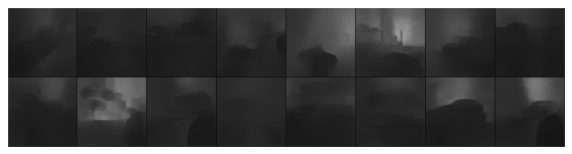

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


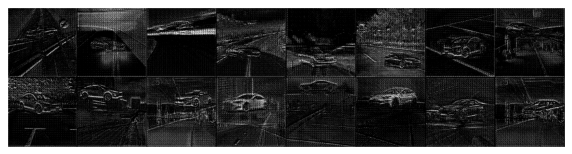

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


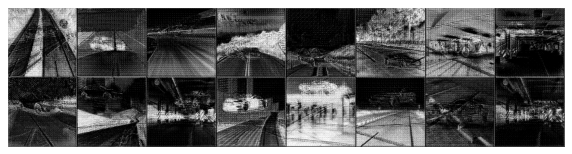

ground truth


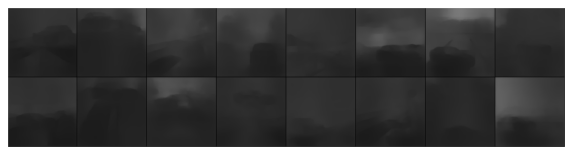

Depth


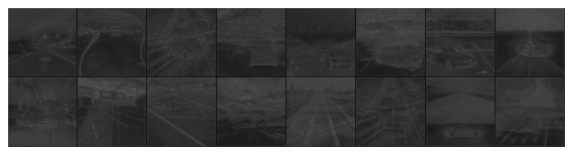

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


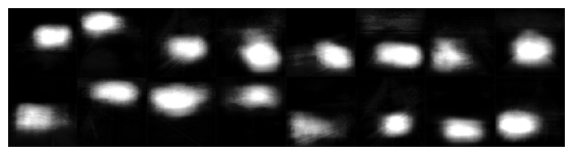

ground truth


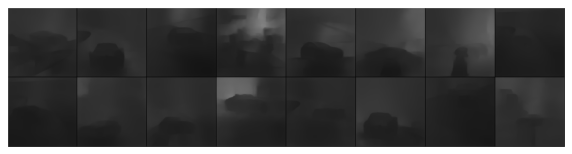

Depth


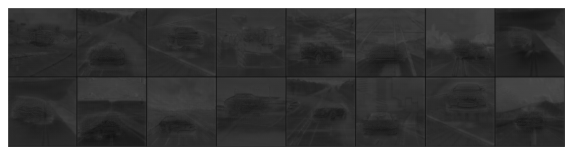

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


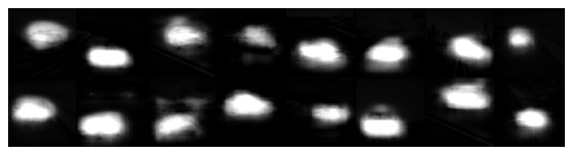

ground truth


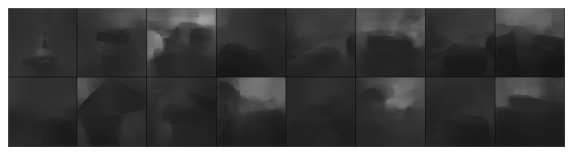

Depth


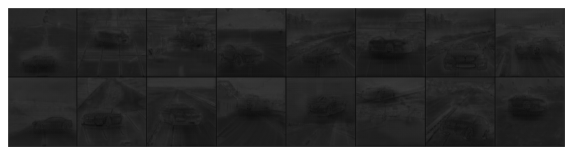

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


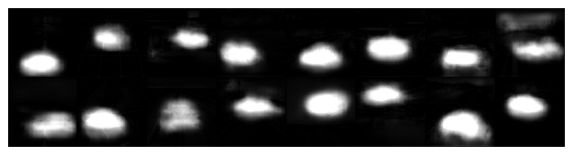

ground truth


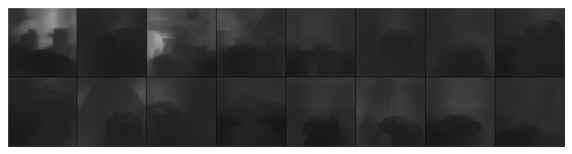

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


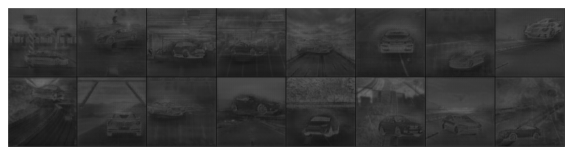

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


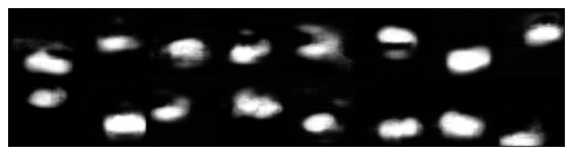

ground truth


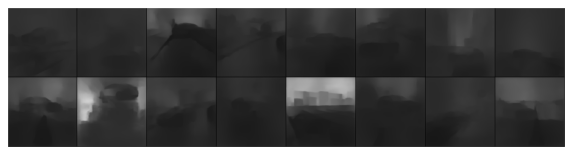

Depth


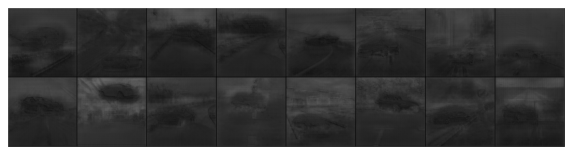

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


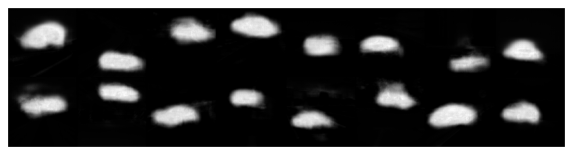

ground truth


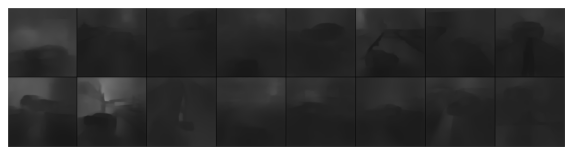

Depth


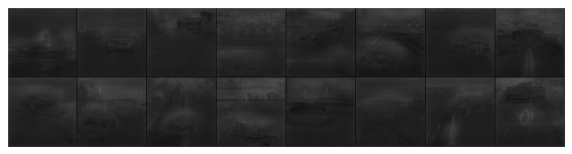

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


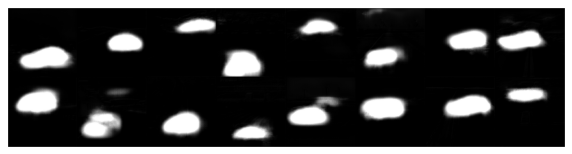

ground truth


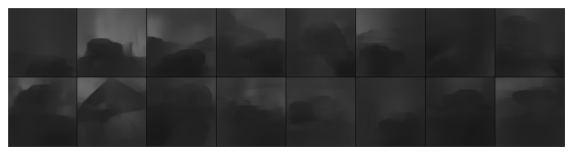

Depth


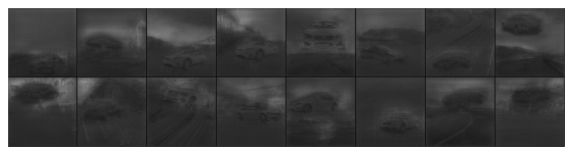

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


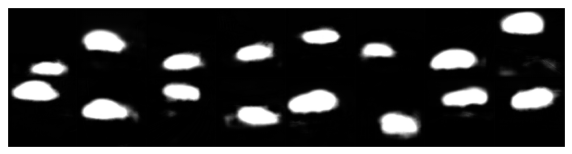

ground truth


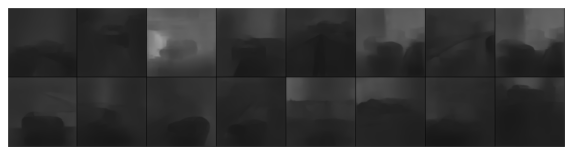

Depth


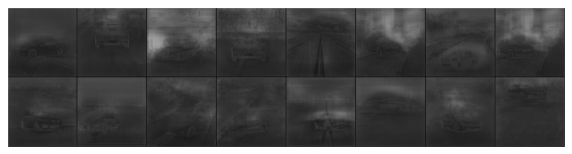

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


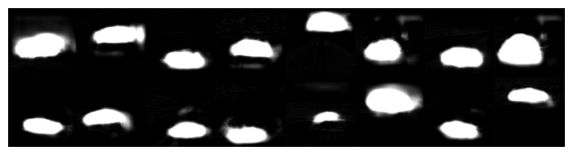

ground truth


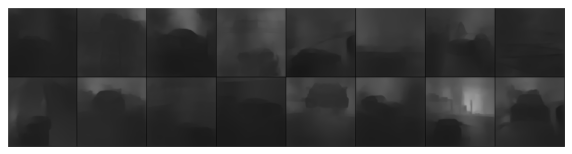

Depth


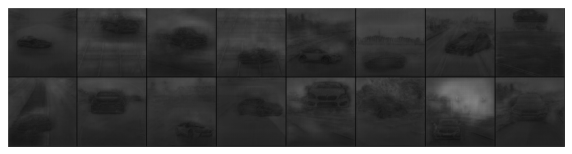

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


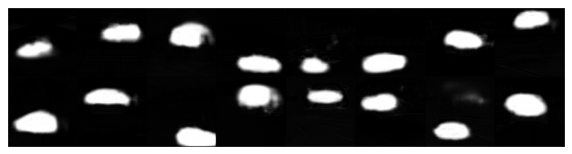

ground truth


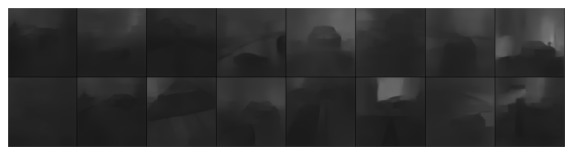

Depth


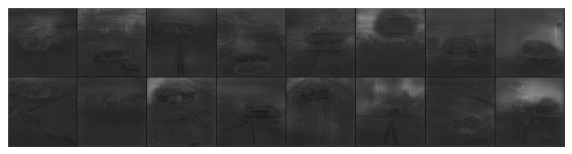

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


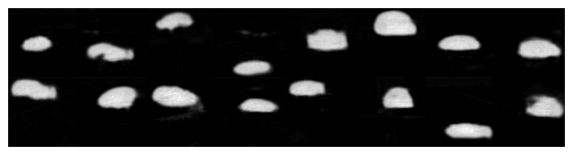

ground truth


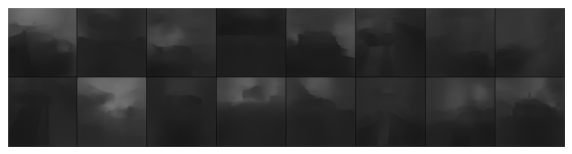

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


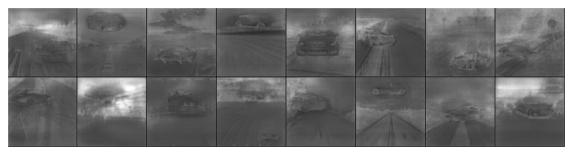

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


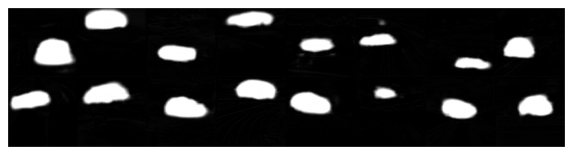

ground truth


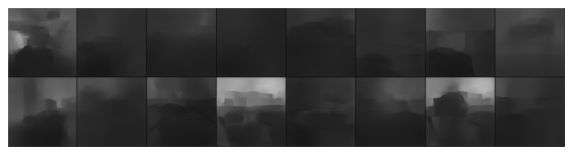

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


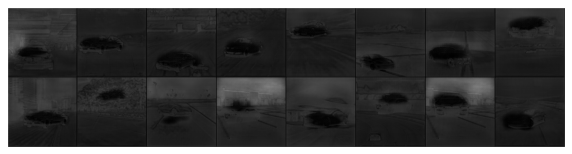

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


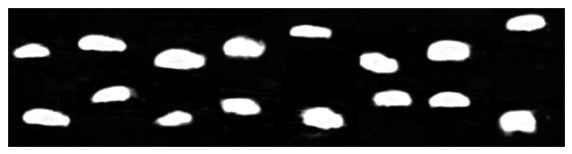

ground truth


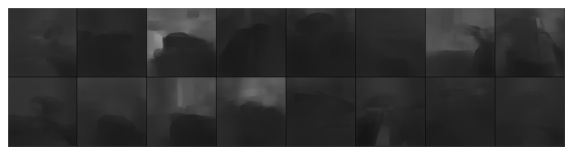

Depth


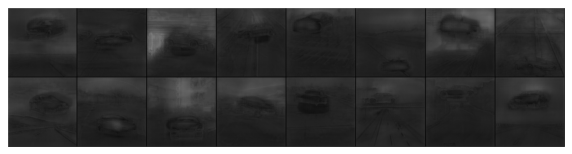

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


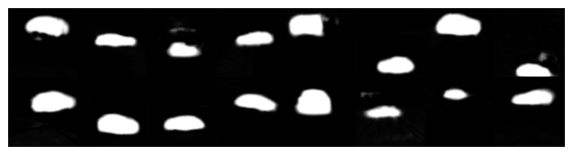

ground truth


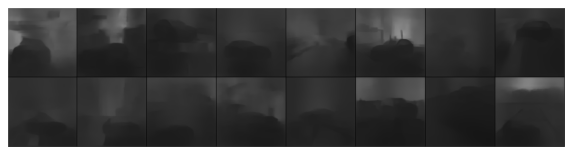

Depth


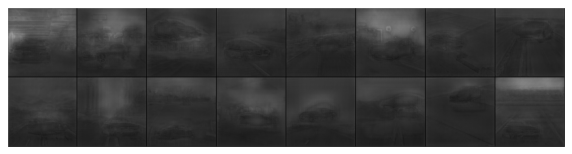

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


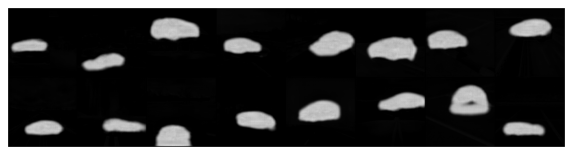

ground truth


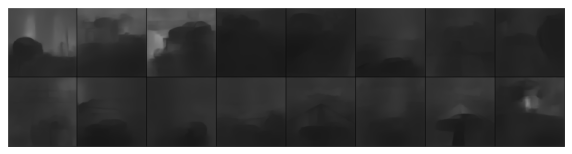

Depth


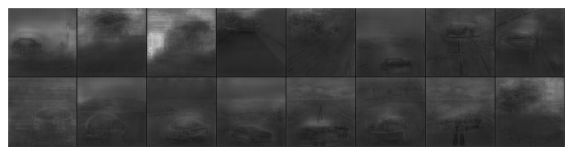

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


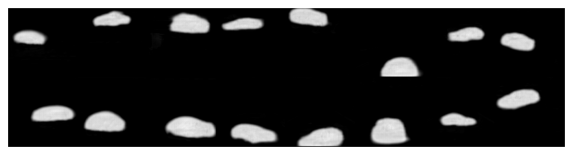

ground truth


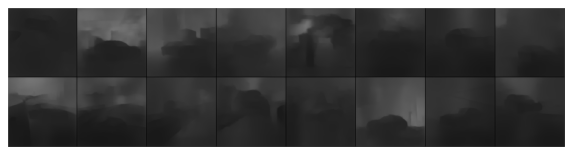

Depth


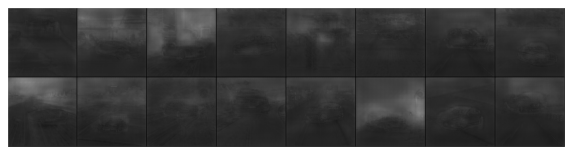

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


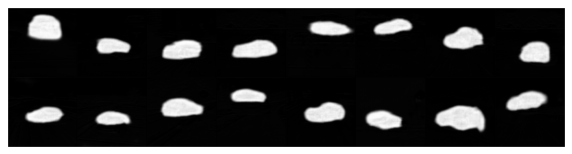

ground truth


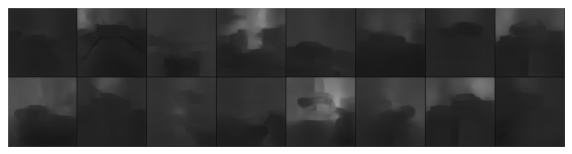

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


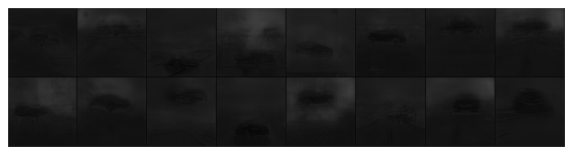

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


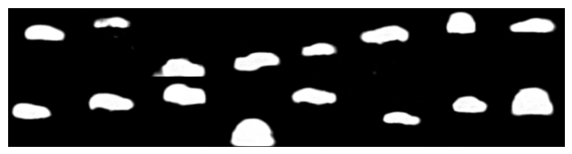

ground truth


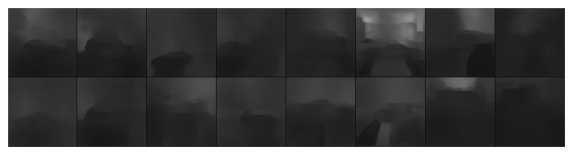

Depth


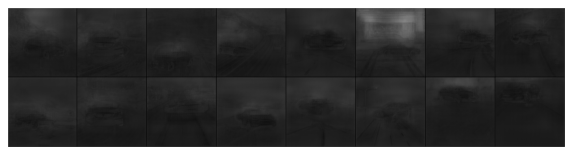

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


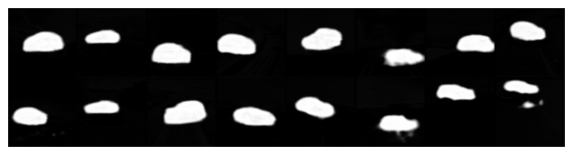

ground truth


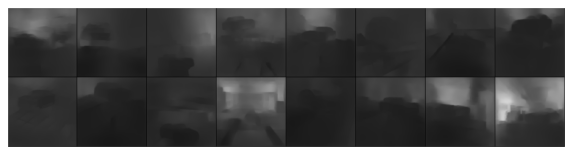

Depth


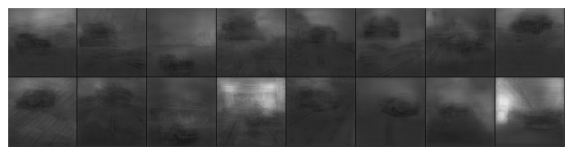

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


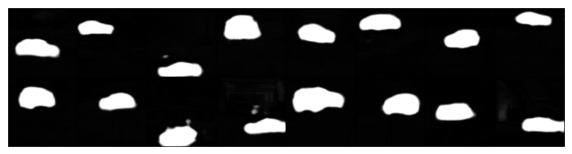

ground truth


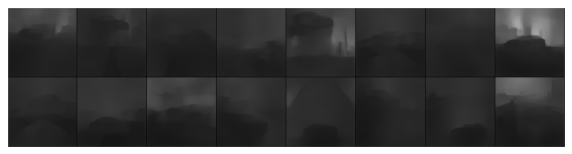

Depth


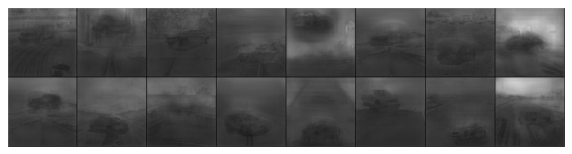

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


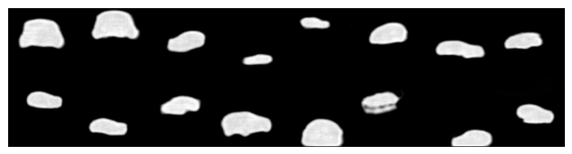

ground truth


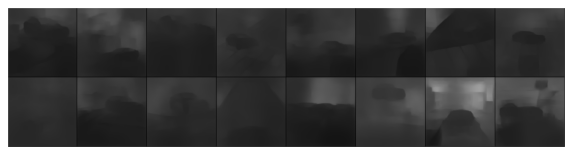

Depth


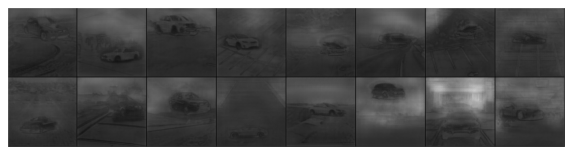

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


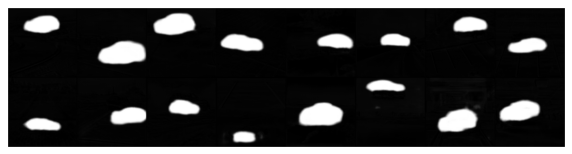

ground truth


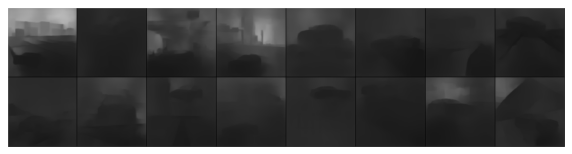

Depth


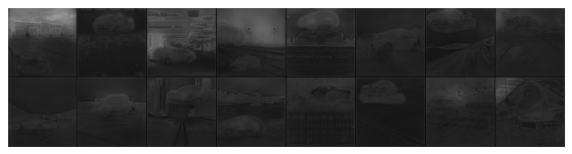

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


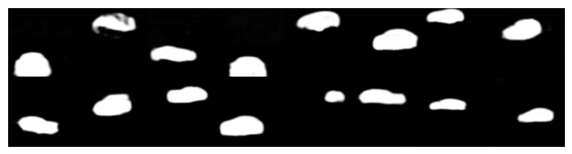

ground truth


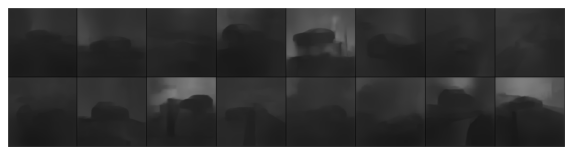

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


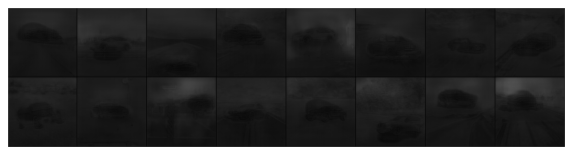

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


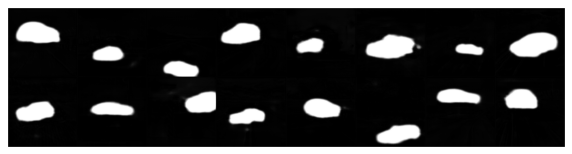

ground truth


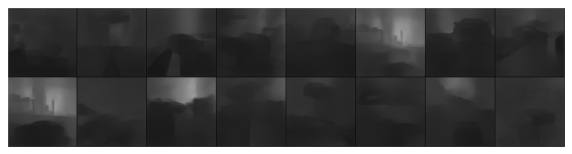

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


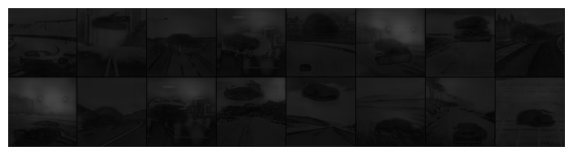

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


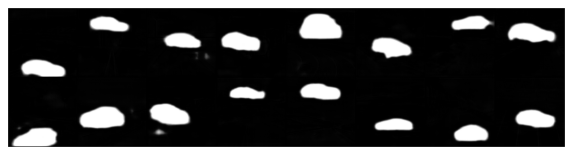

ground truth


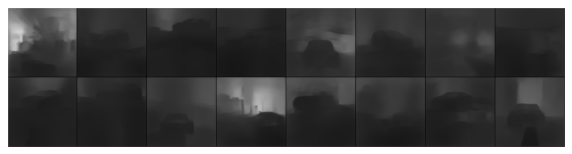

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


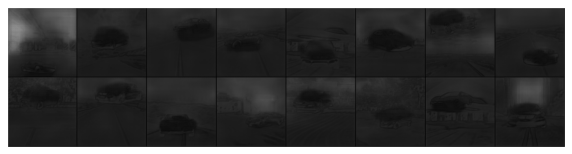

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


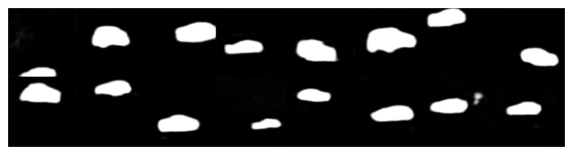

ground truth


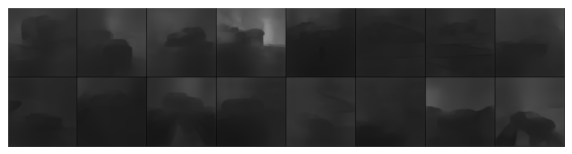

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


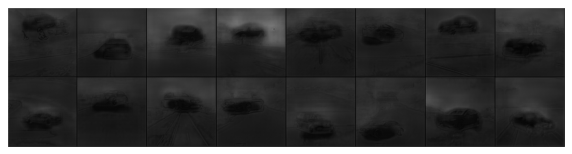

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


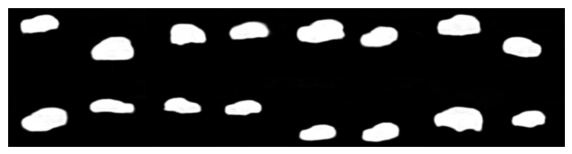

ground truth


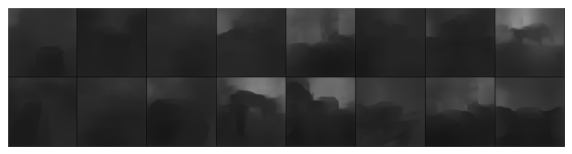

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


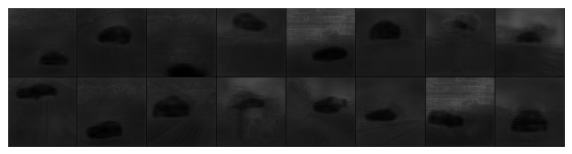

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


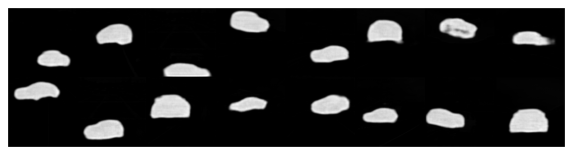

ground truth


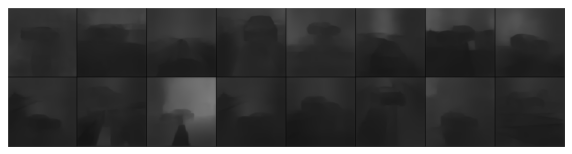

Depth


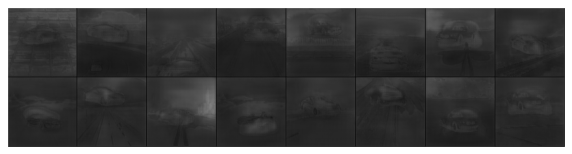

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


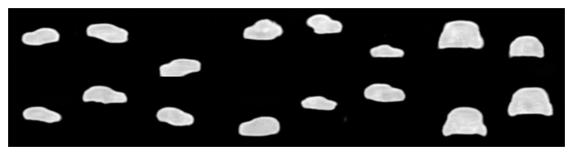

ground truth


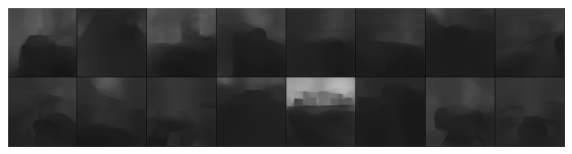

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


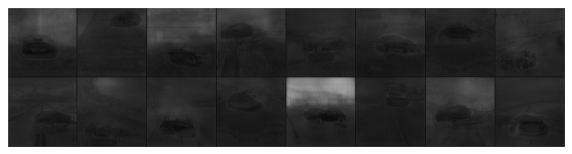

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


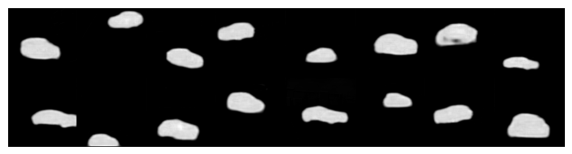

ground truth


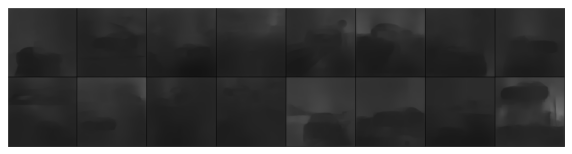

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


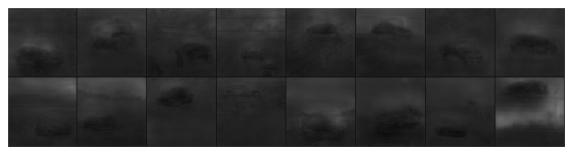

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


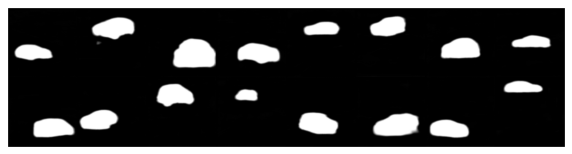

ground truth


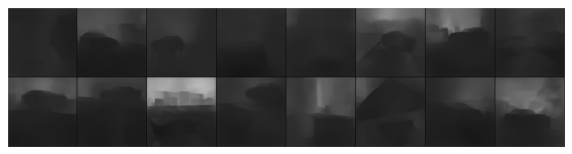

Depth


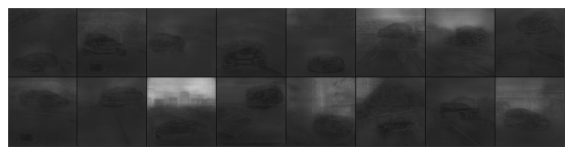

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


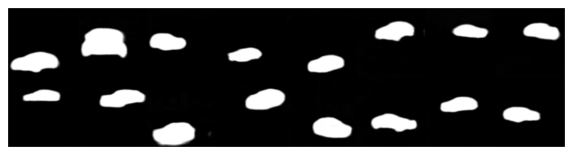

ground truth


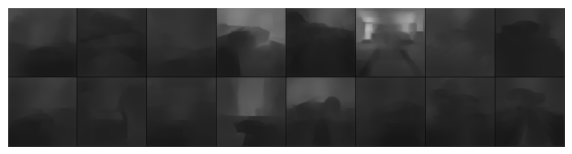

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


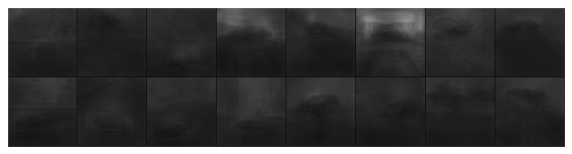

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


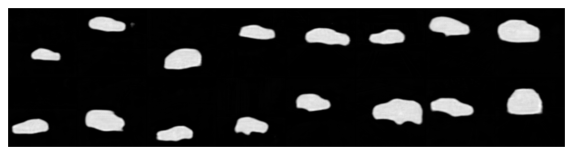

ground truth


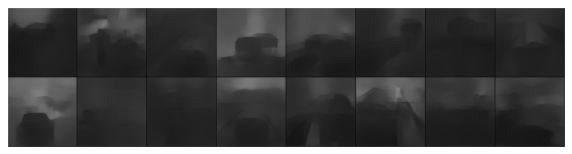

Depth


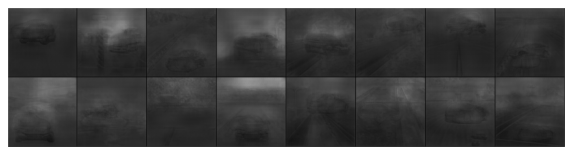

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


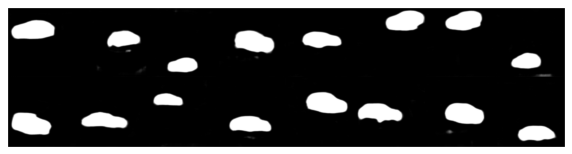

ground truth


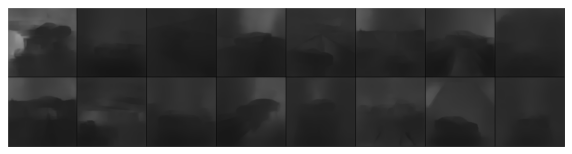

Depth


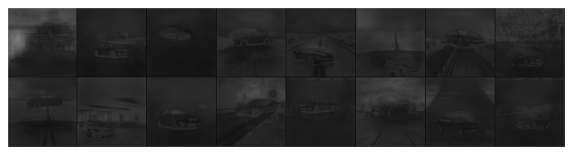

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


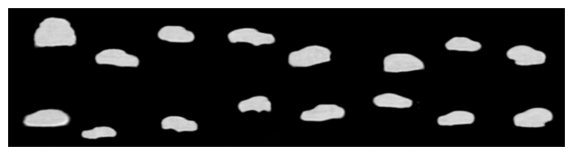

ground truth


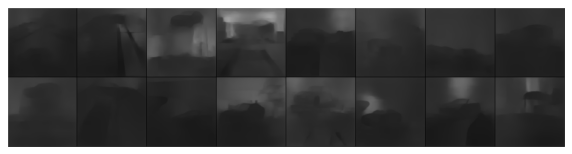

Depth


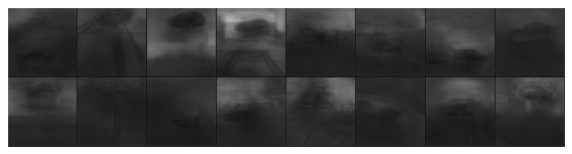

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


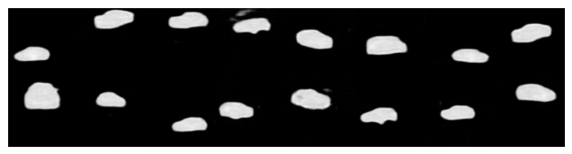

ground truth


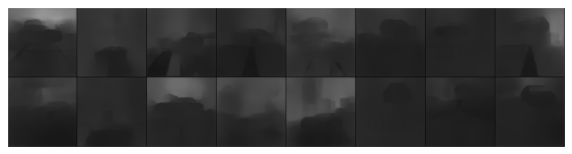

Depth


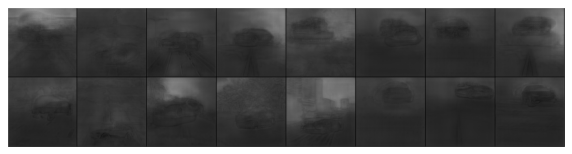

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


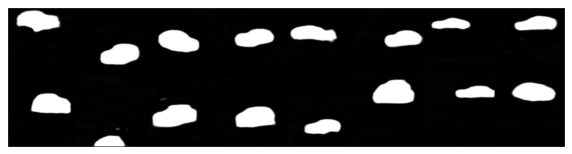

ground truth


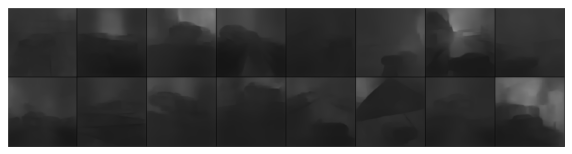

Depth


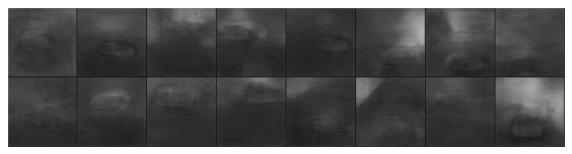

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


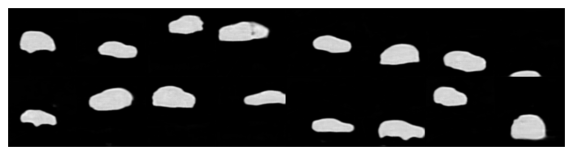

ground truth


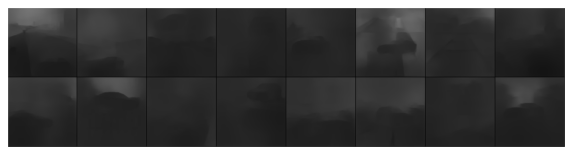

Depth


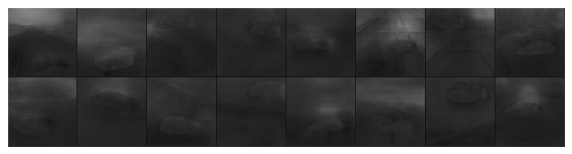

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


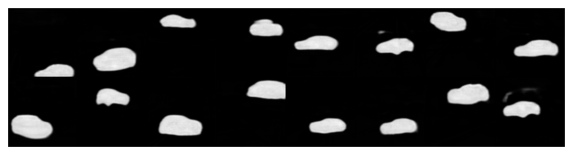

ground truth


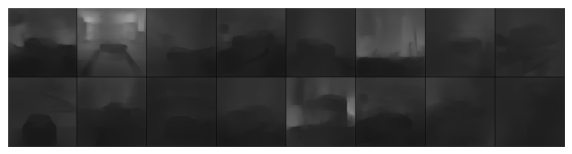

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


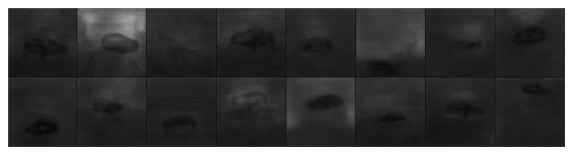

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


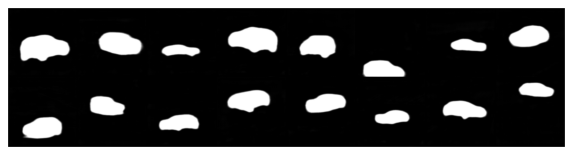

ground truth


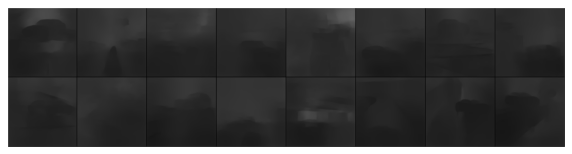

Depth


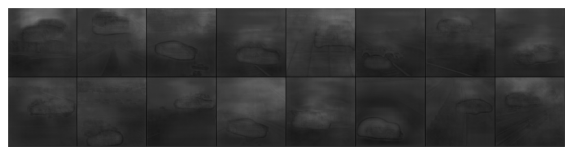

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


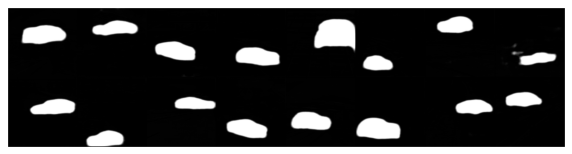

ground truth


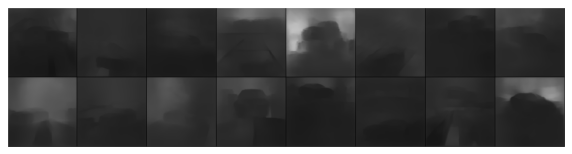

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


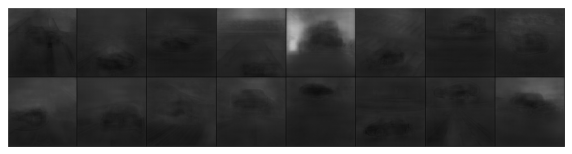

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


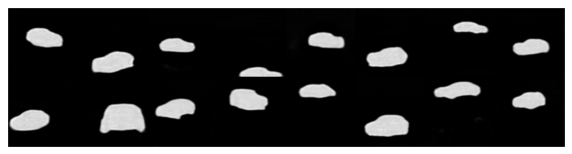

ground truth


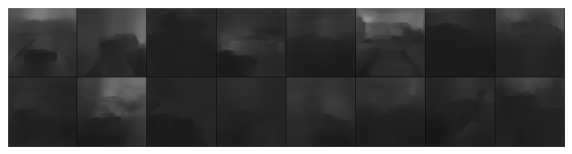

Depth


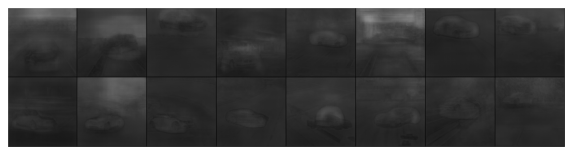

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


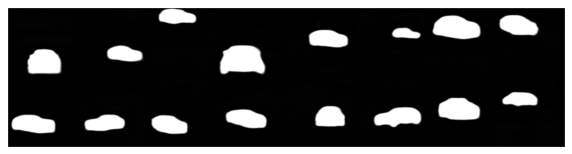

ground truth


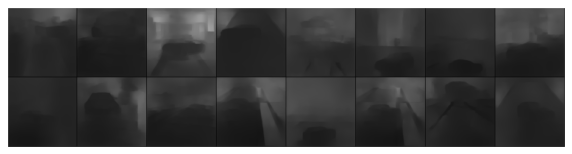

Depth


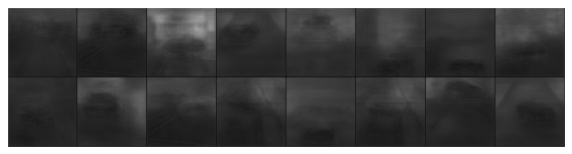

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


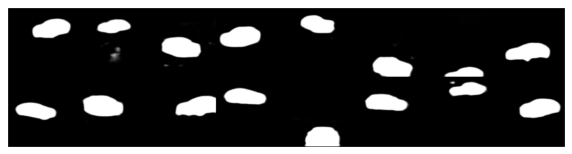

ground truth


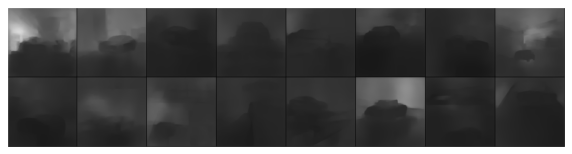

Depth


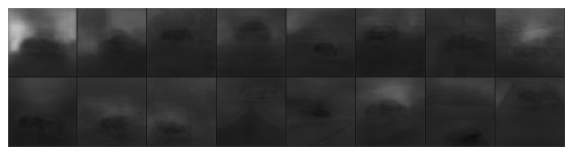

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


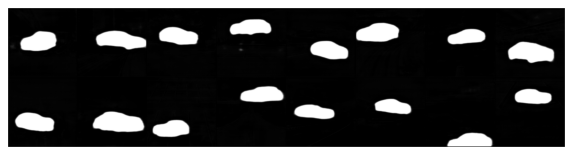

ground truth


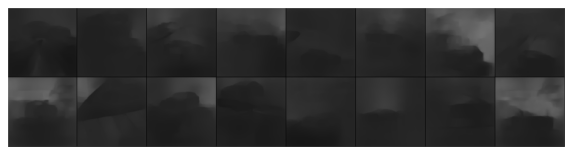

Depth


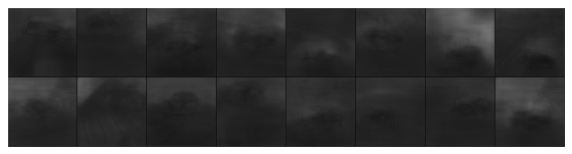

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


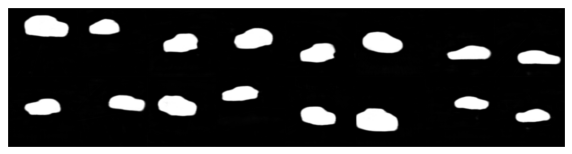

ground truth


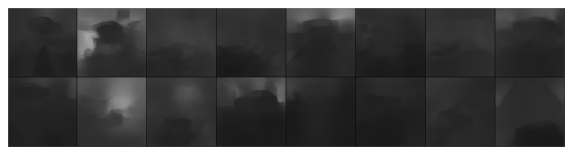

Depth


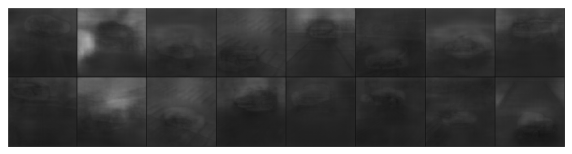

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


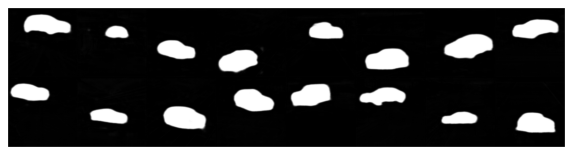

ground truth


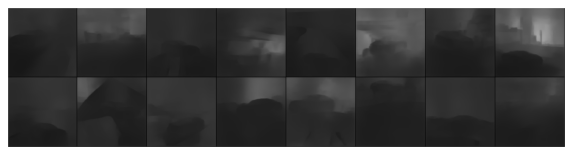

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


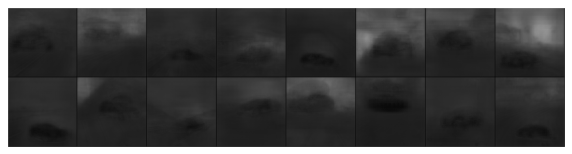

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


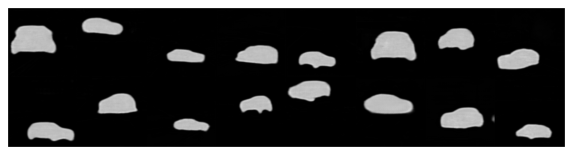

ground truth


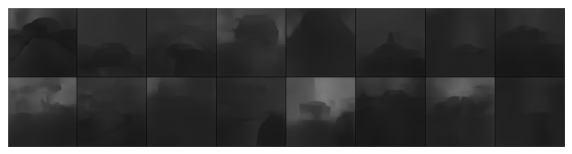

Depth


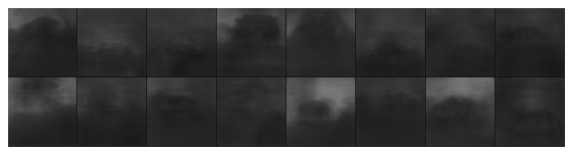

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


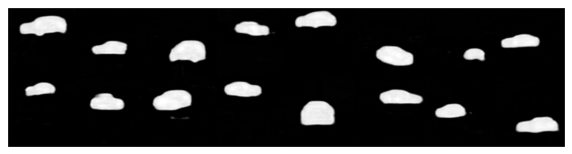

ground truth


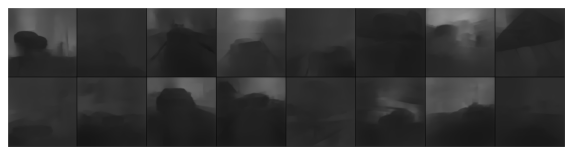

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


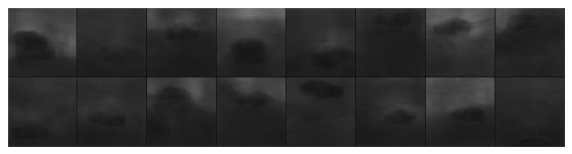

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


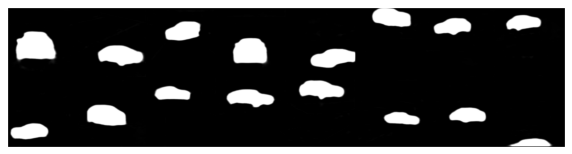

ground truth


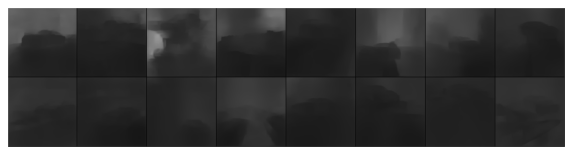

Depth


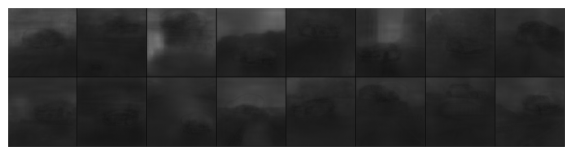

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


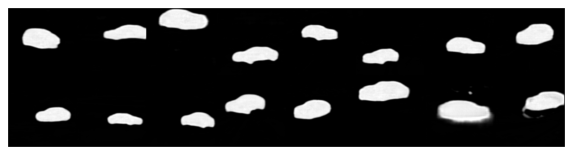

ground truth


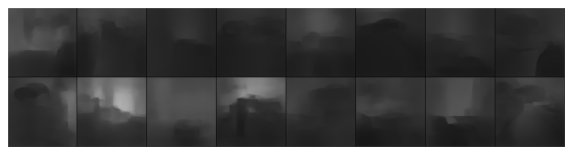

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


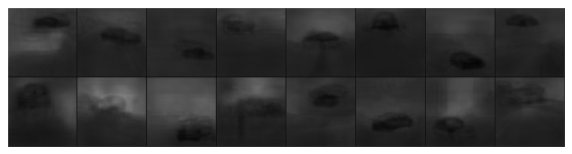

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


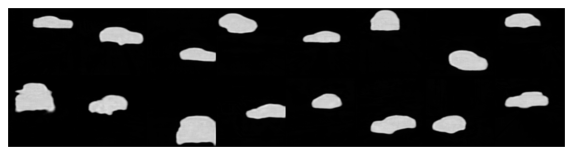

ground truth


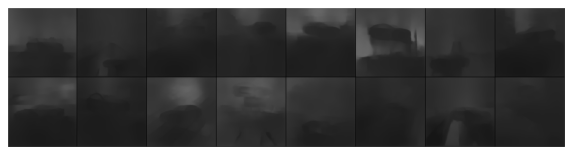

Depth


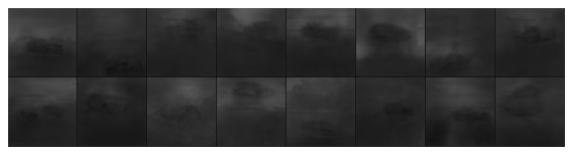

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


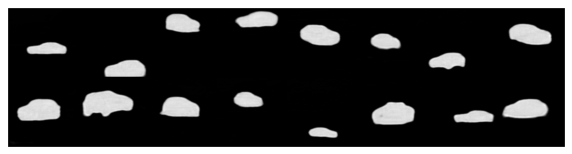

ground truth


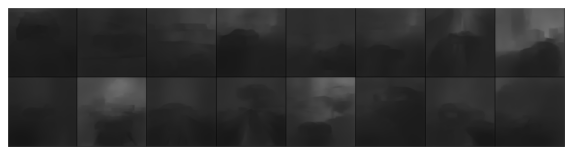

Depth


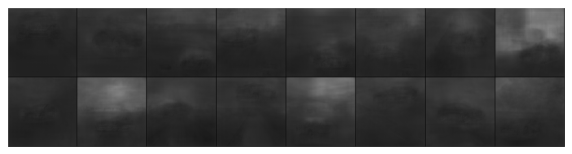

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


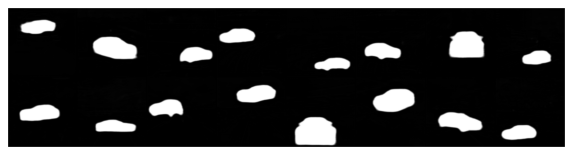

ground truth


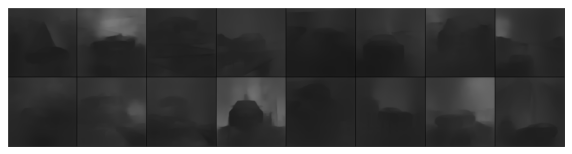

Depth


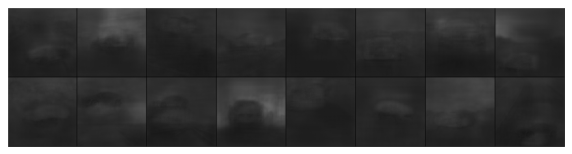

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


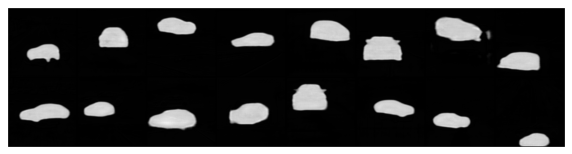

ground truth


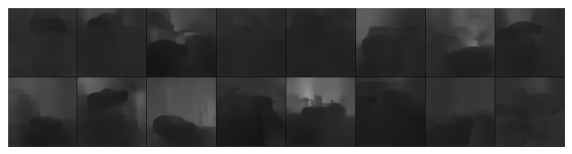

Depth


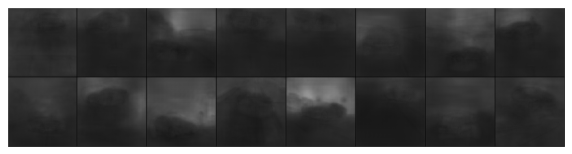

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


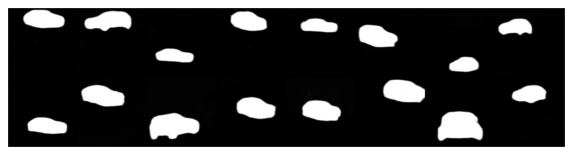

ground truth


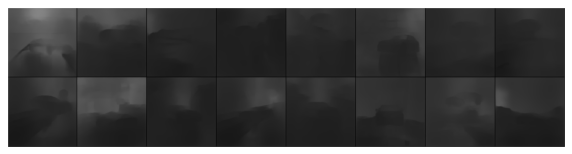

Depth


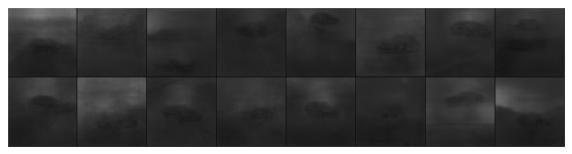

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


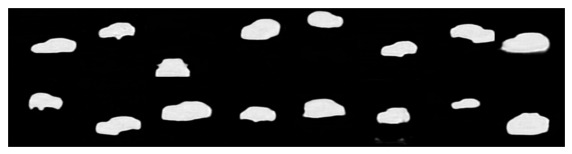

ground truth


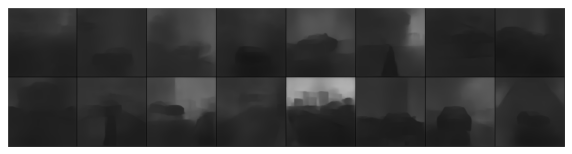

Depth


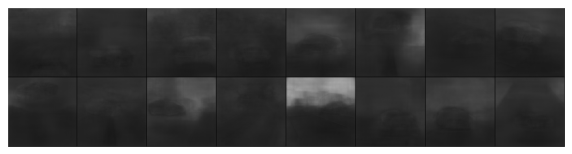

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


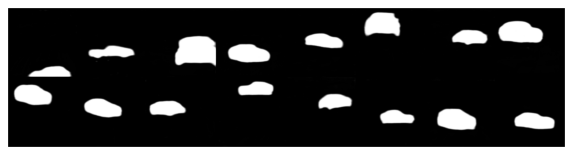

ground truth


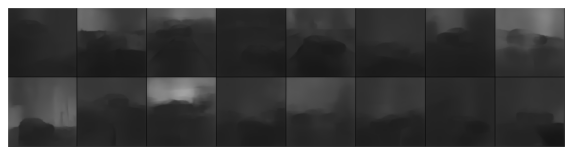

Depth


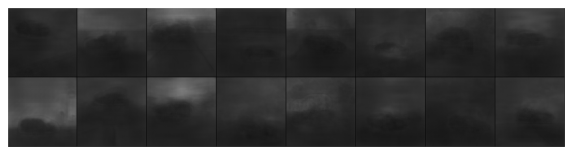

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


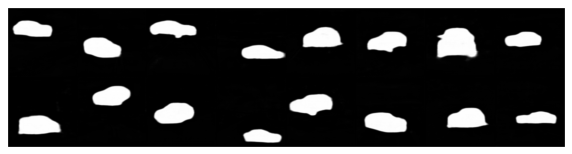

ground truth


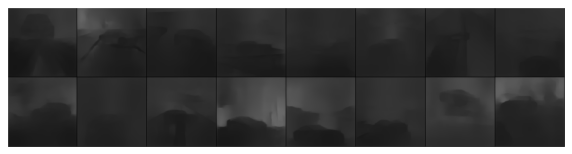

Depth


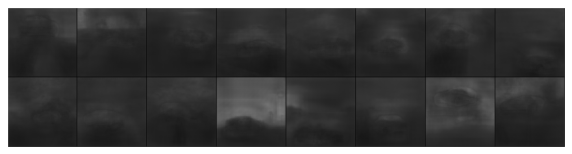

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


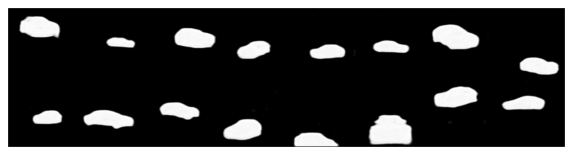

ground truth


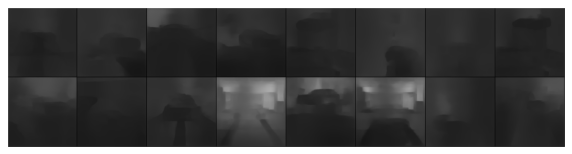

Depth


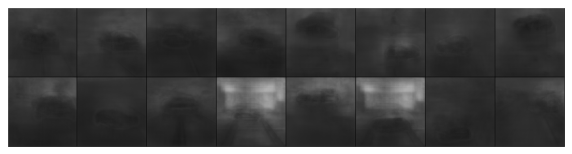

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


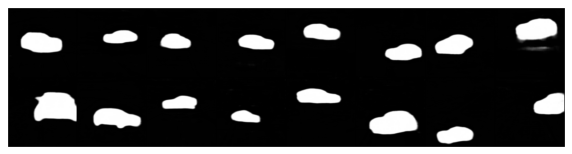

ground truth


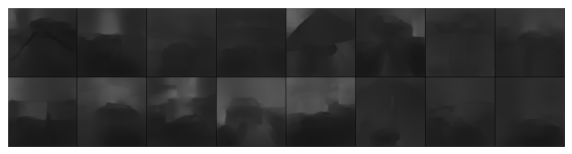

Depth


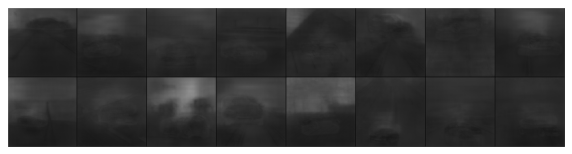

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


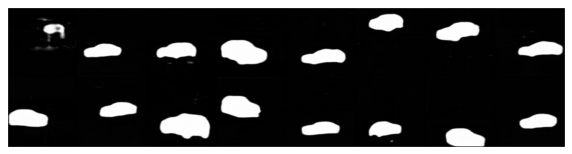

ground truth


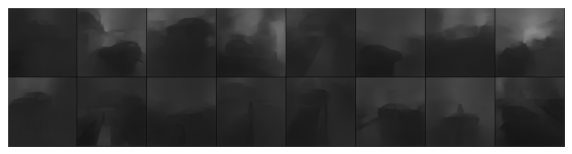

Depth


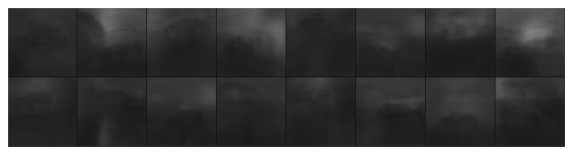

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


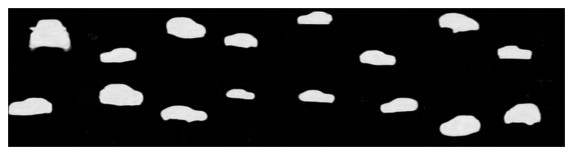

ground truth


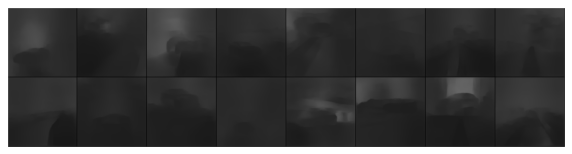

Depth


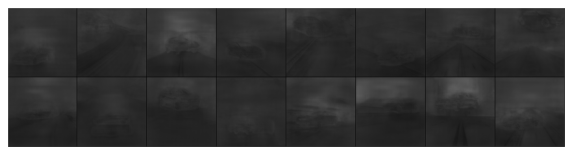

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


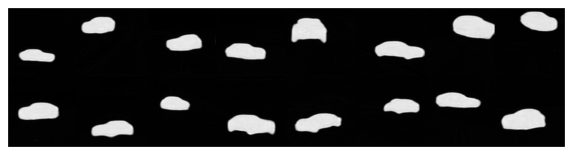

ground truth


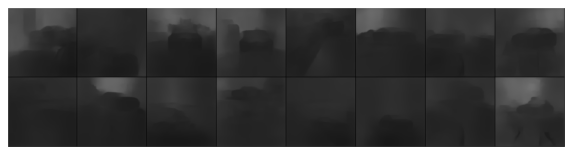

Depth


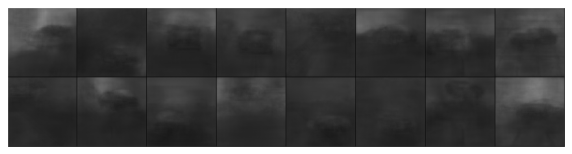

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


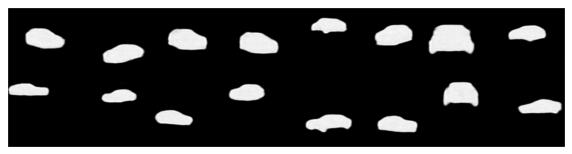

ground truth


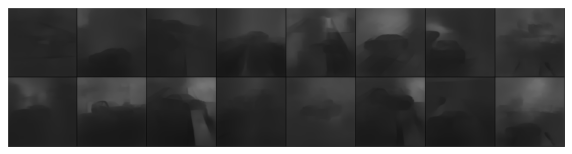

Depth


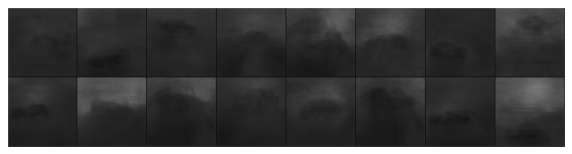

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


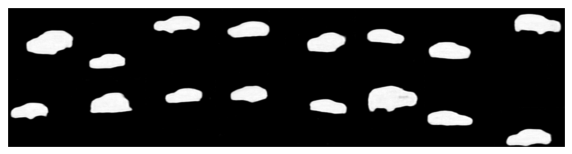

ground truth


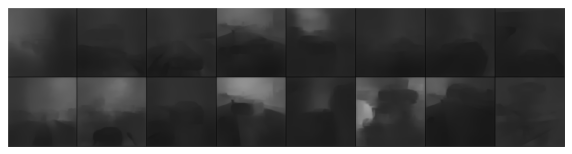

Depth


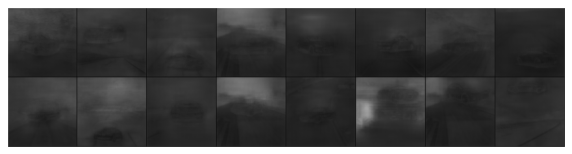

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


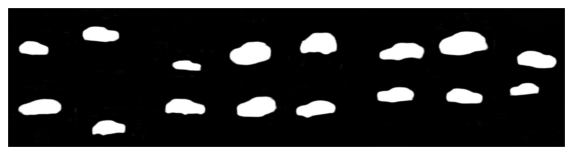

ground truth


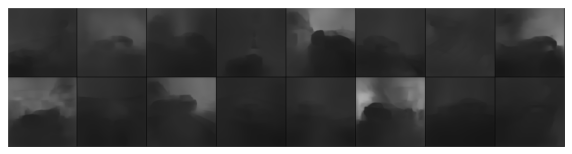

Depth


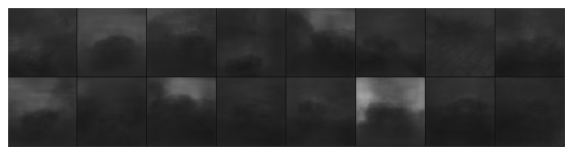

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


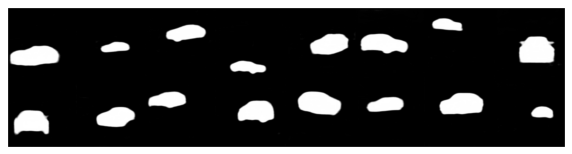

ground truth


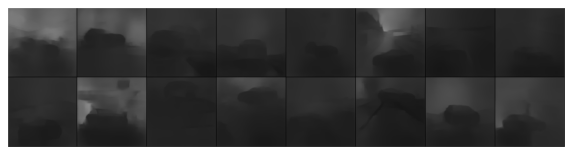

Depth


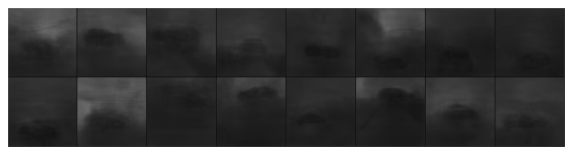

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


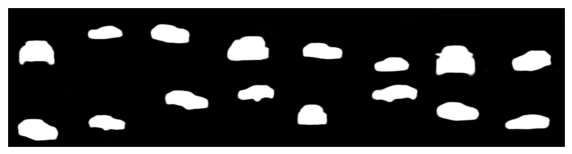

ground truth


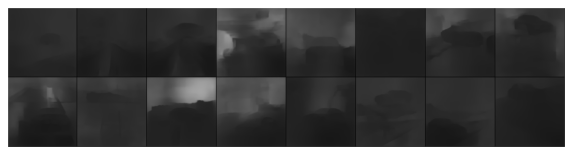

Depth


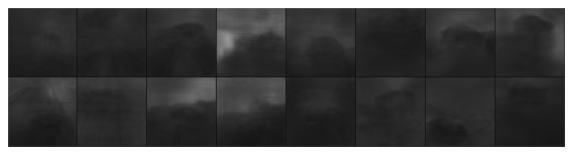

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


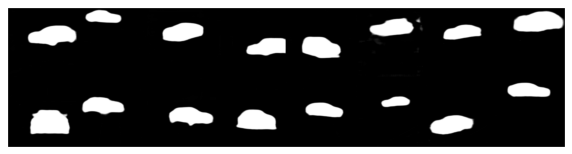

ground truth


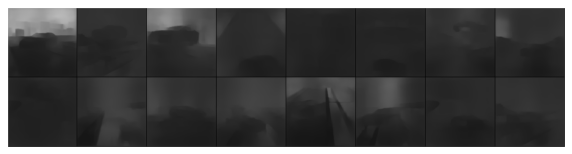

Depth


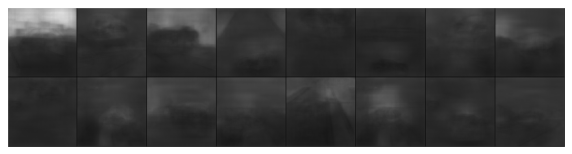

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


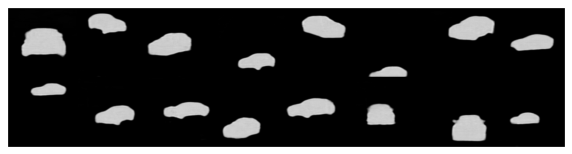

ground truth


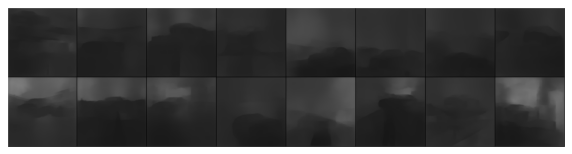

Depth


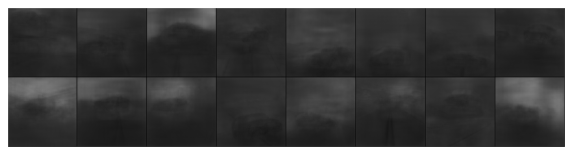

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


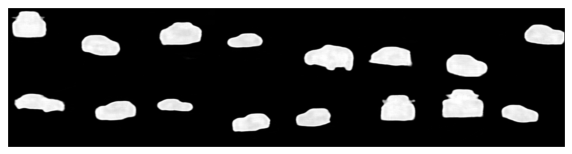

ground truth


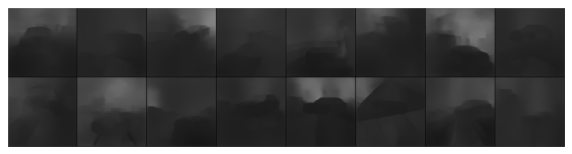

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


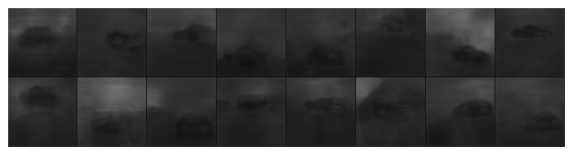

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


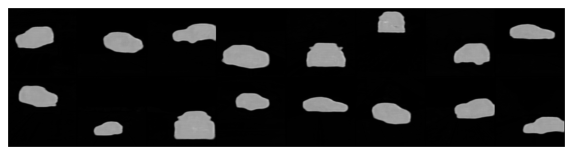

ground truth


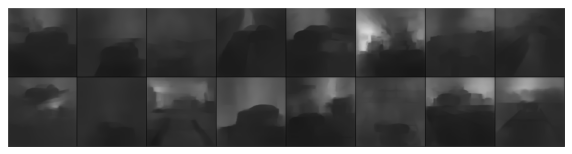

Depth


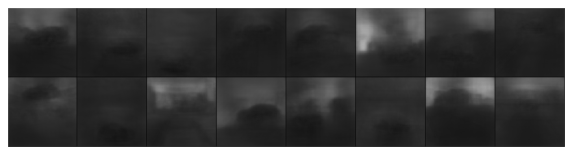

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


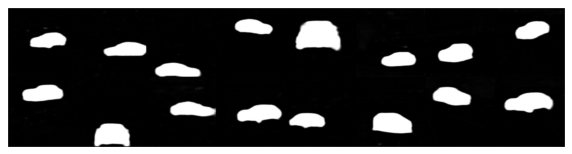

ground truth


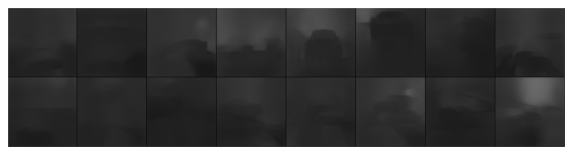

Depth


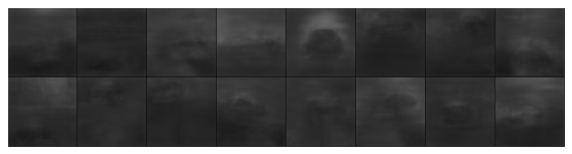

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


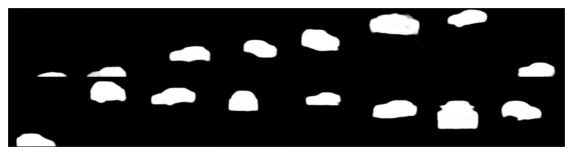

ground truth


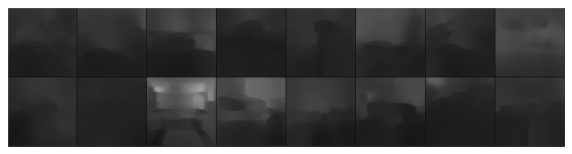

Depth


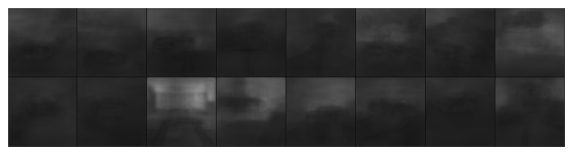

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


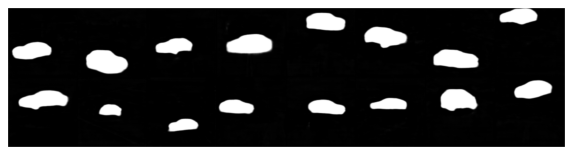

ground truth


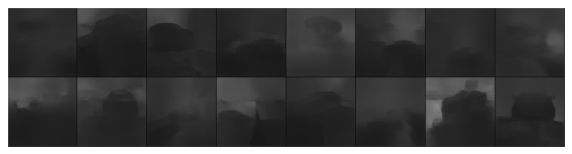

Depth


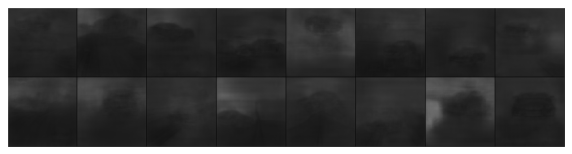

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


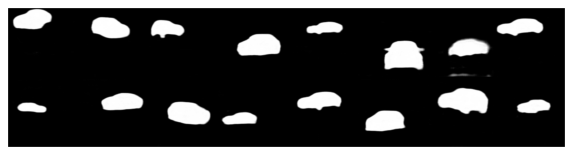

ground truth


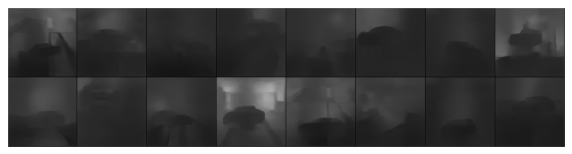

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth


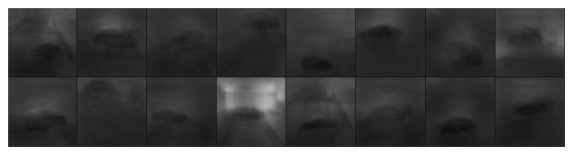

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


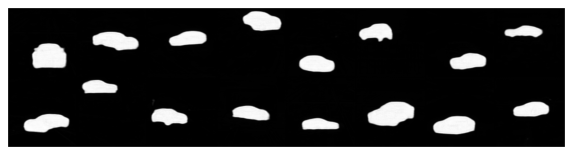

ground truth


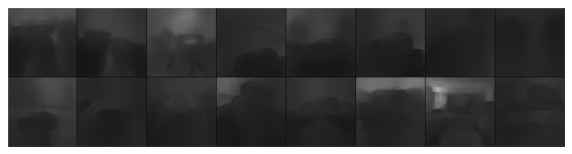

Depth


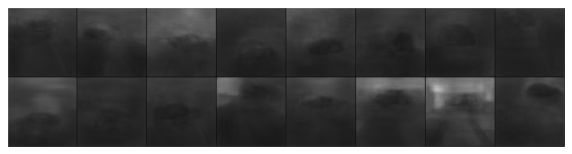

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


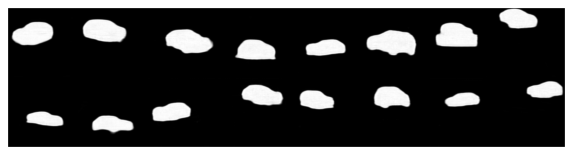

ground truth


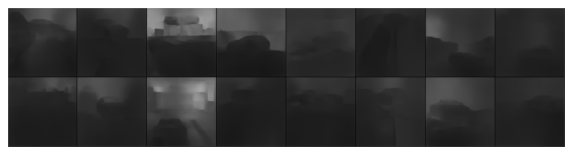

Depth


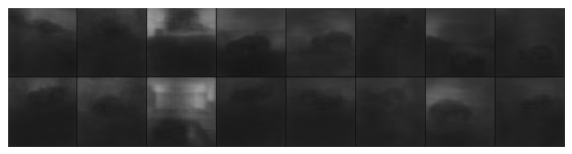

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


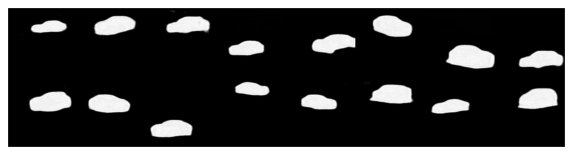

ground truth


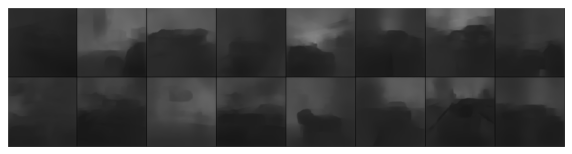

Depth


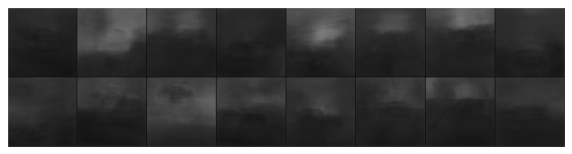

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


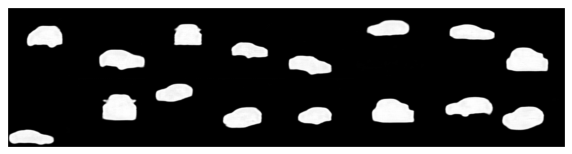

ground truth


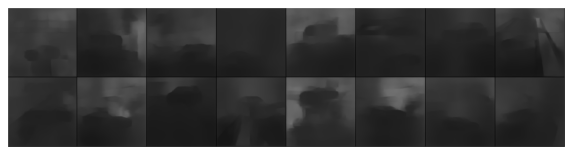

Depth


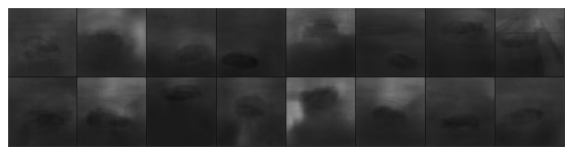

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


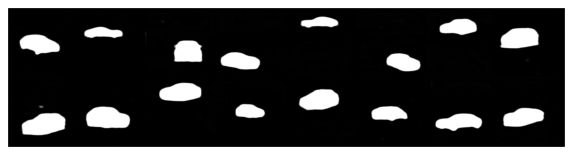

ground truth


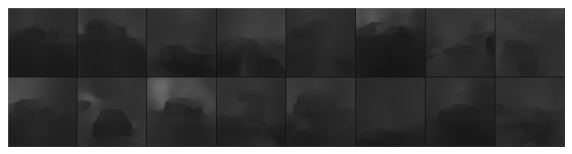

Depth


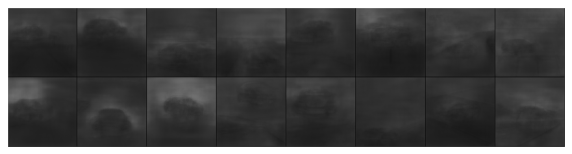

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


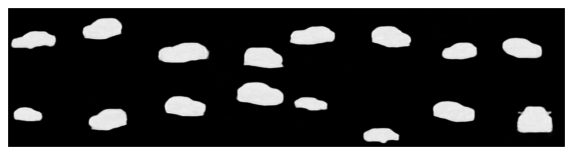

ground truth


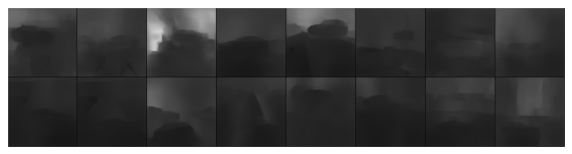

Depth


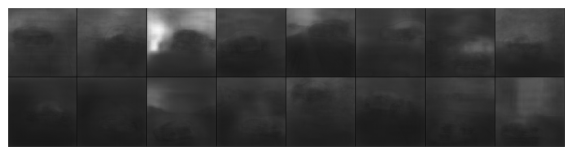

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


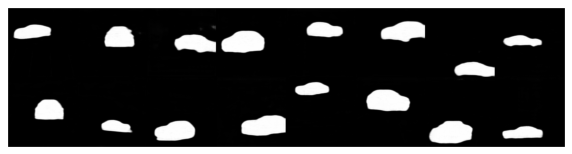

ground truth


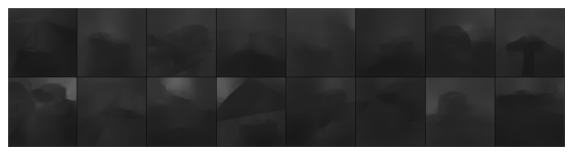

Depth


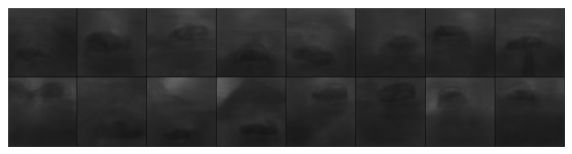

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


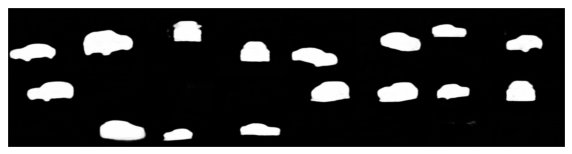

ground truth


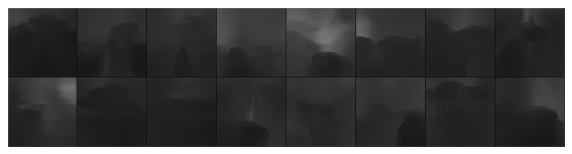

Depth


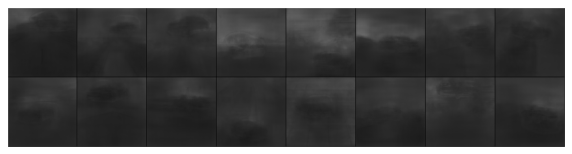

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


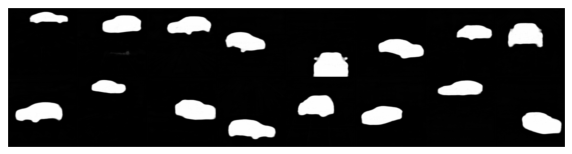

ground truth


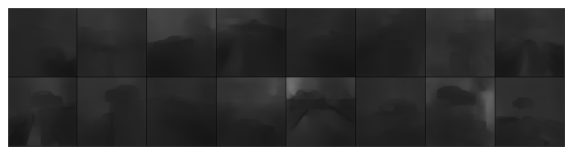

Depth


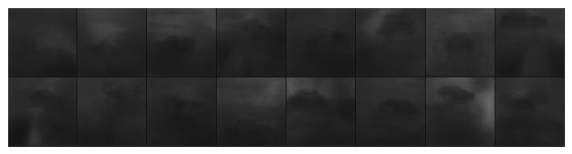

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


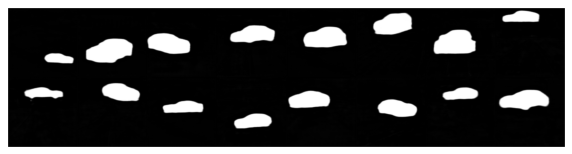

ground truth


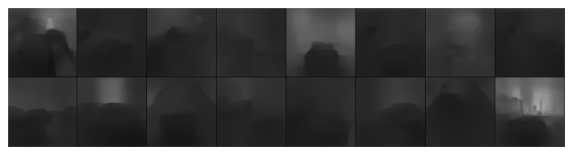

Depth


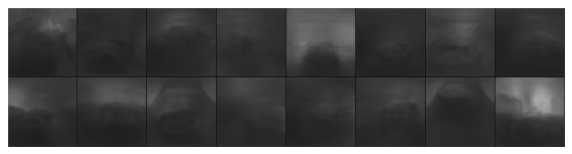

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


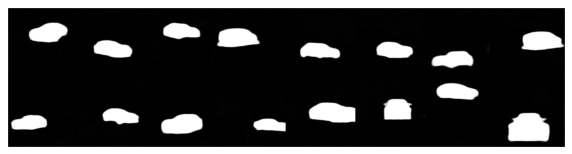

ground truth


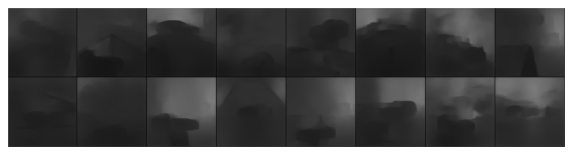

Depth


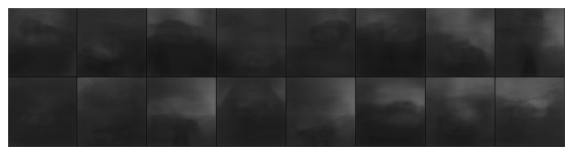

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


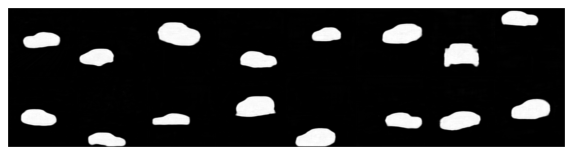

ground truth


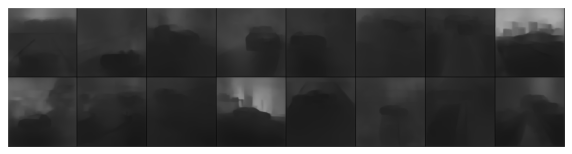

Depth


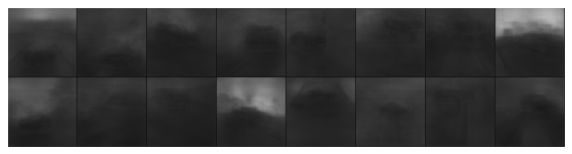

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


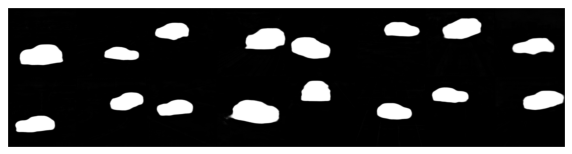

ground truth


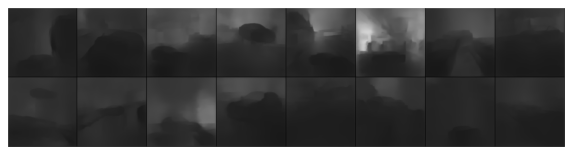

Depth


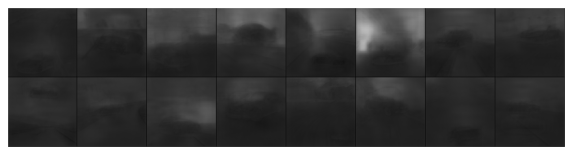

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


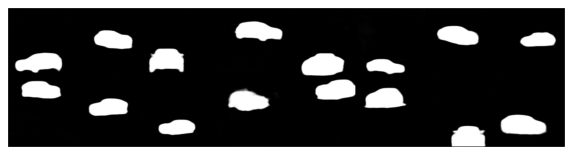

ground truth


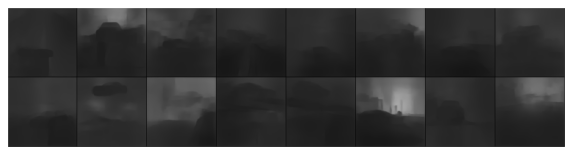

Depth


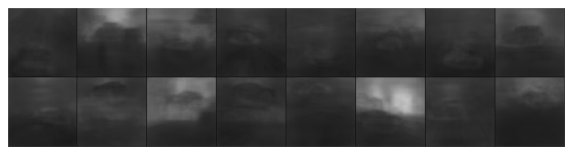

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


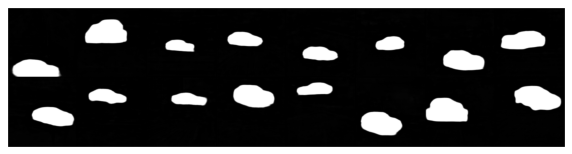

ground truth


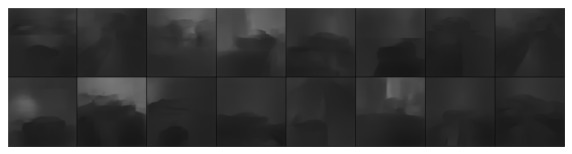

Depth


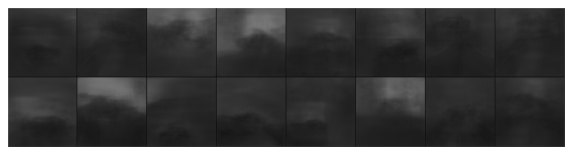

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


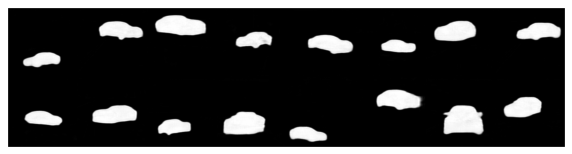

ground truth


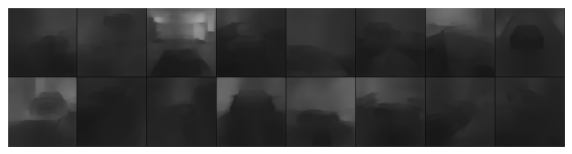

Depth


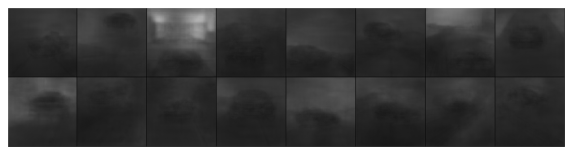

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


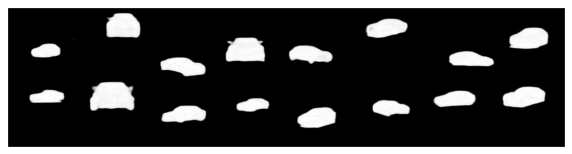

ground truth


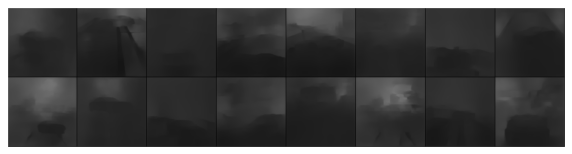

Depth


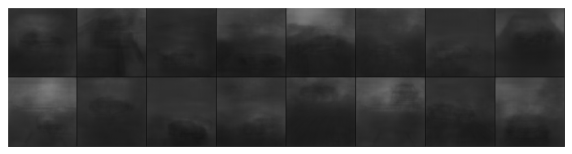

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


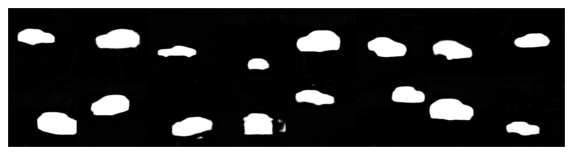

ground truth


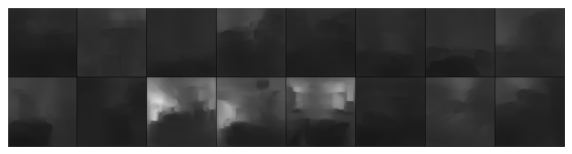

Depth


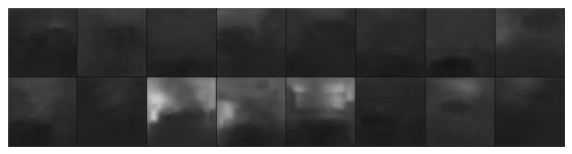

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


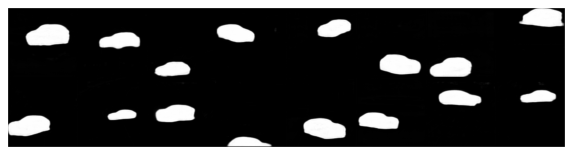

ground truth


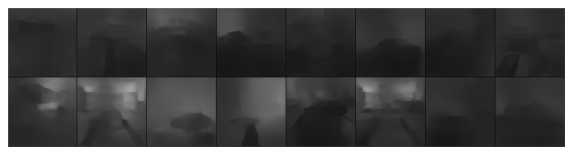

Depth


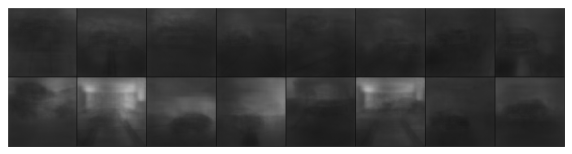

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


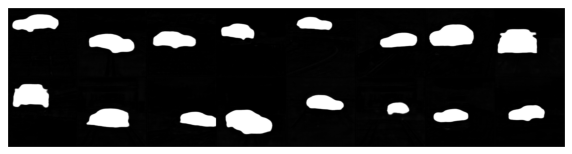

ground truth


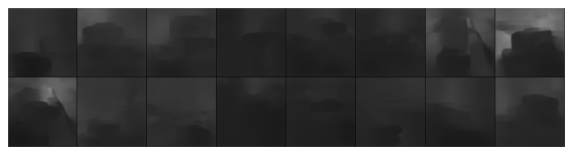

Depth


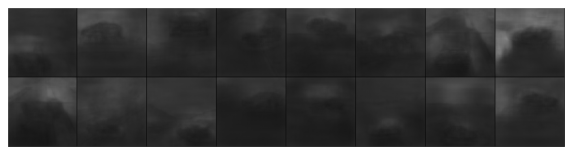

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


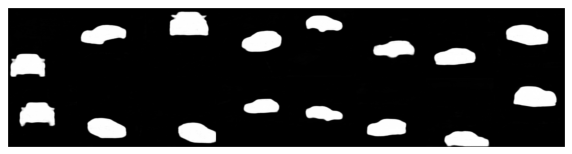

ground truth


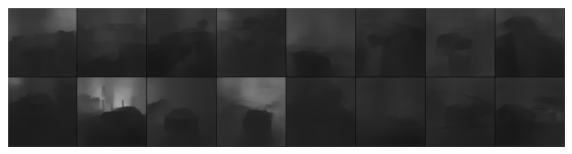

Depth


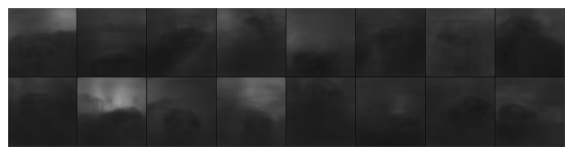

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


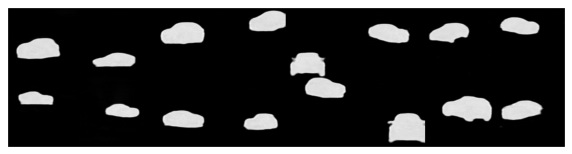

ground truth


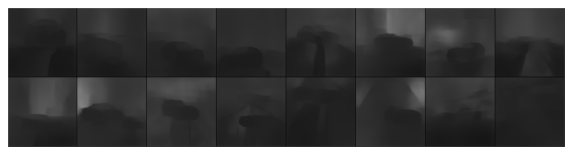

Depth


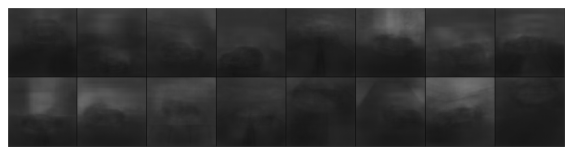

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


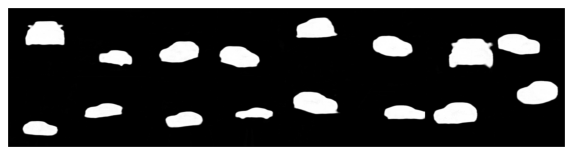

ground truth


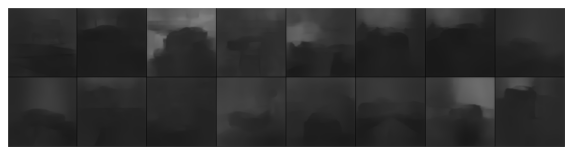

Depth


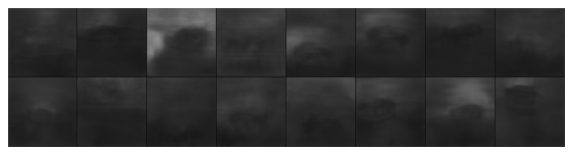

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


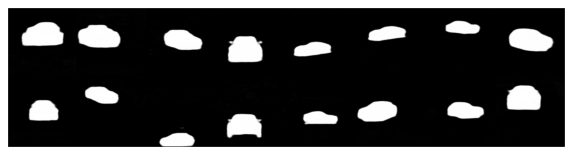

ground truth


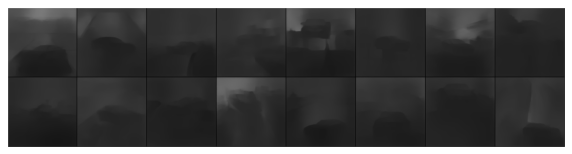

Depth


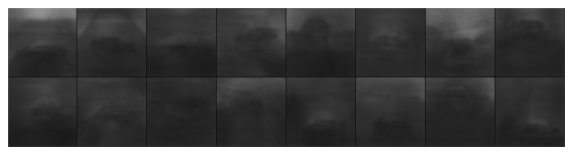

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


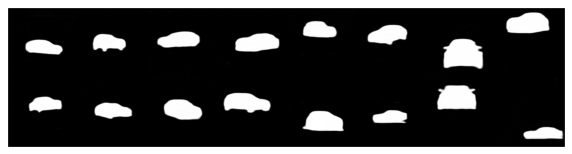

ground truth


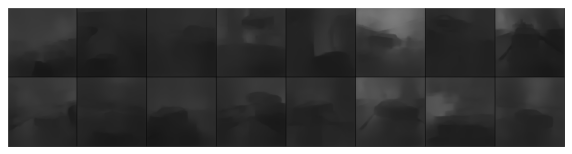

Depth


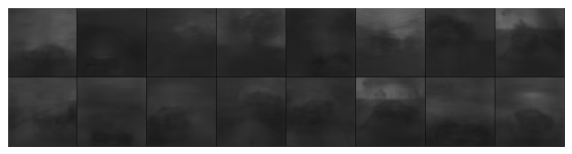

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


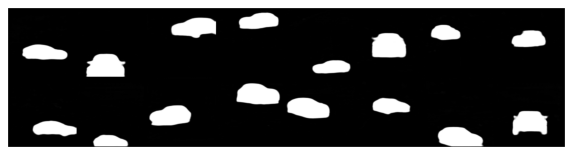

ground truth


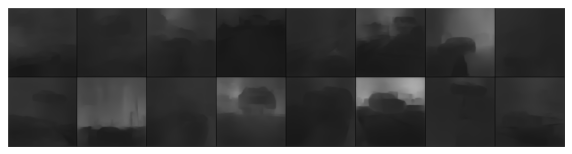

Depth


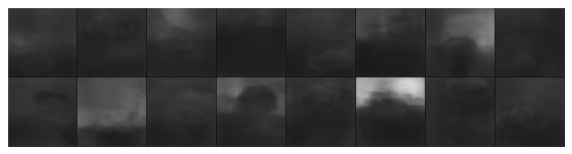

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


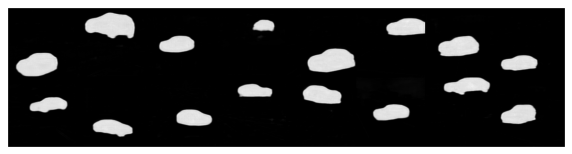

ground truth


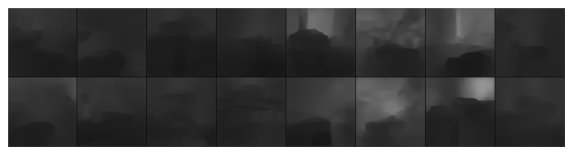

Depth


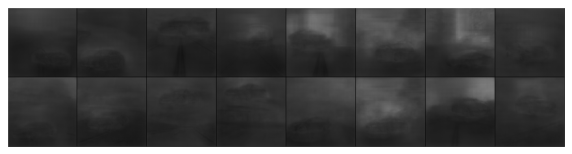

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


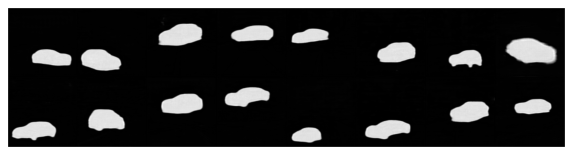

ground truth


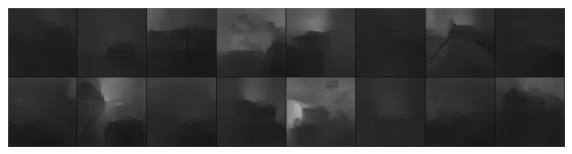

Depth


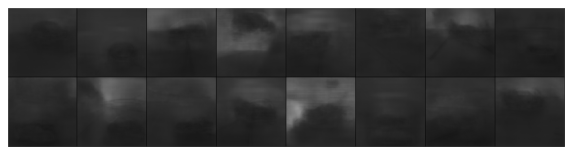

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


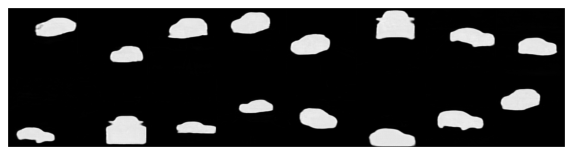

ground truth


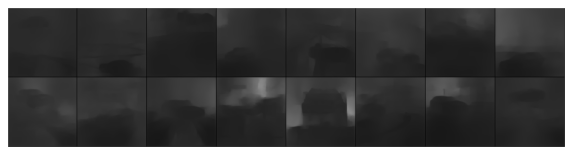

Depth


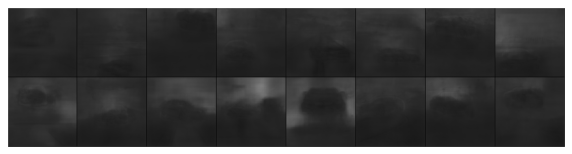

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


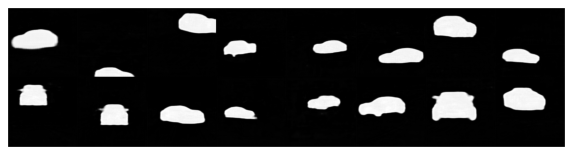

ground truth


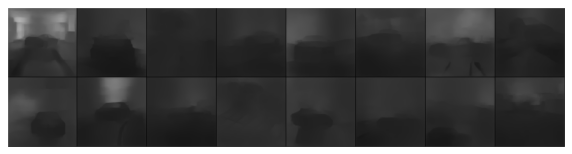

Depth


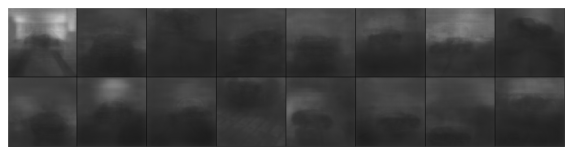

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


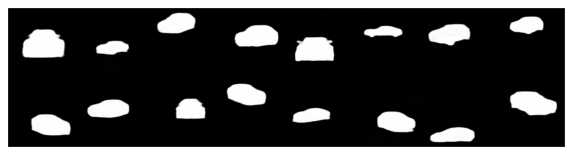

ground truth


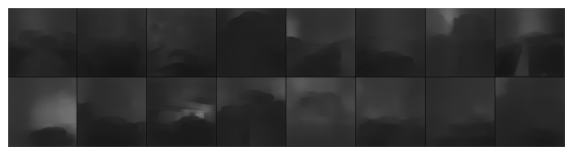

Depth


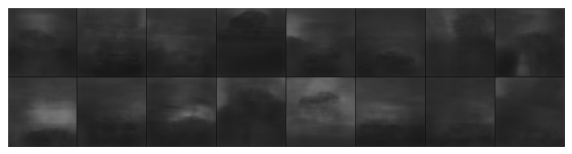

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


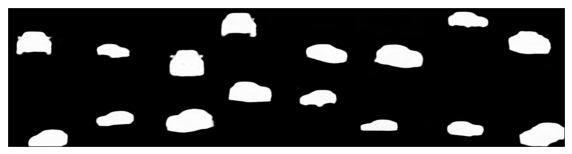

ground truth


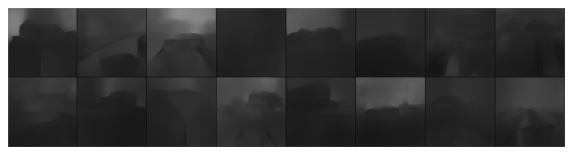

Depth


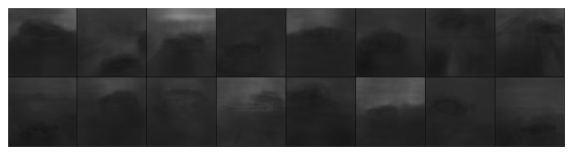

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


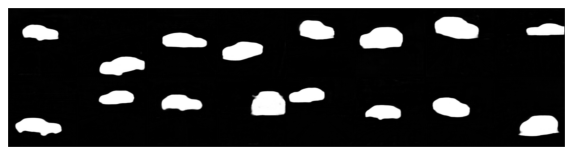

ground truth


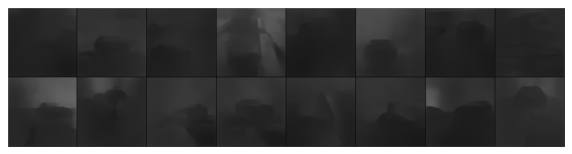

Depth


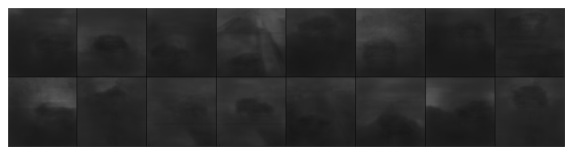

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


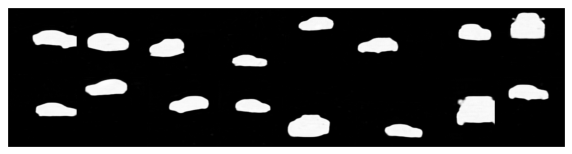

ground truth


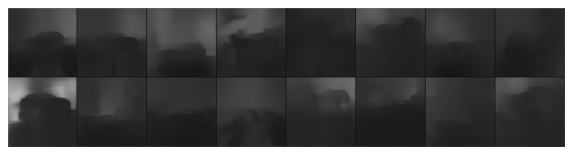

Depth


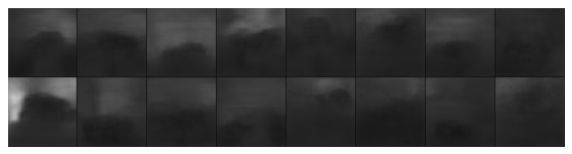

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


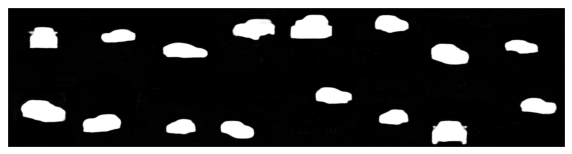

ground truth


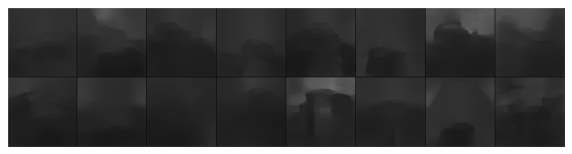

Depth


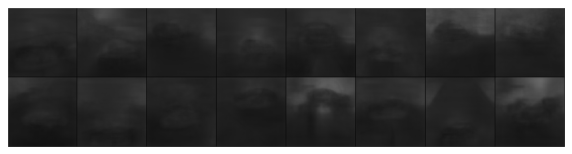

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


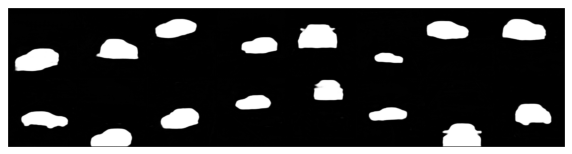

ground truth


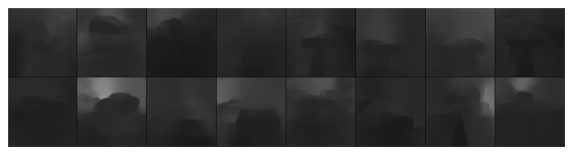

Depth


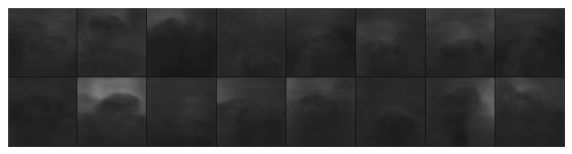

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


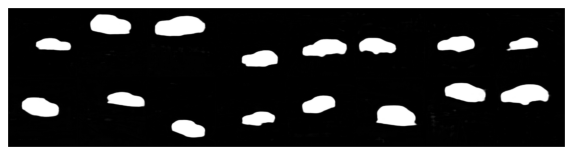

ground truth


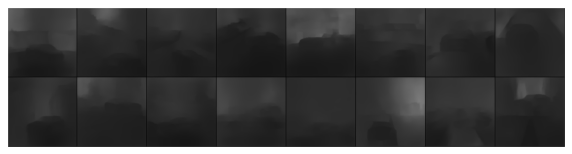

Depth


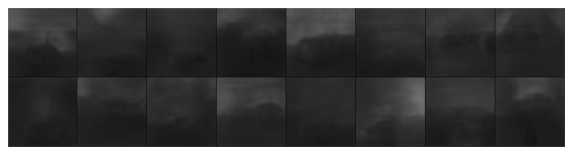

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


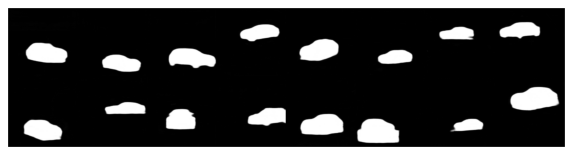

ground truth


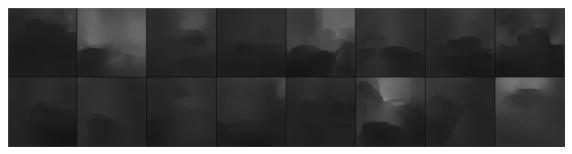

Depth


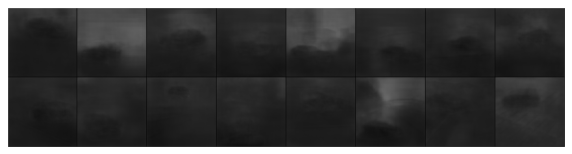

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


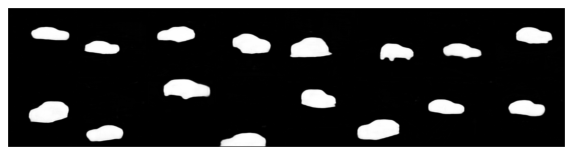

ground truth


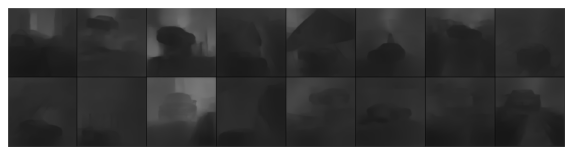

Depth


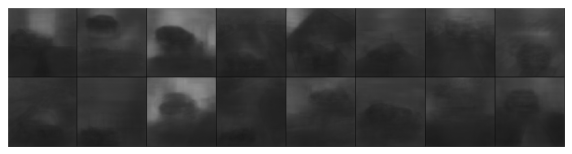

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


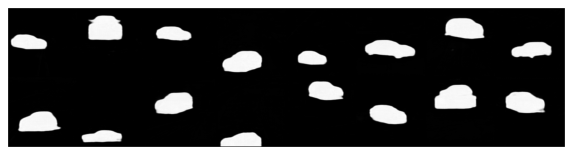

ground truth


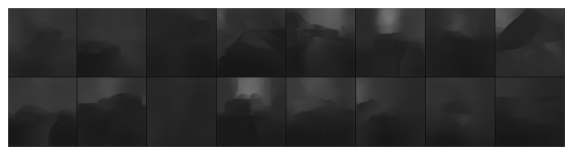

Depth


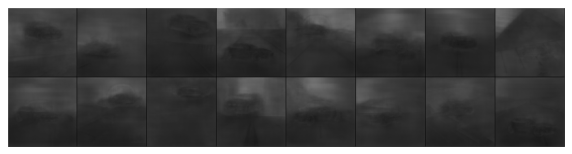

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


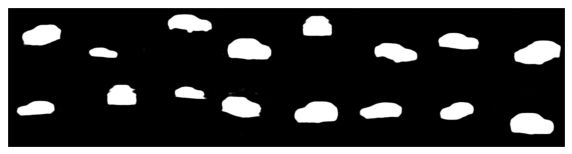

ground truth


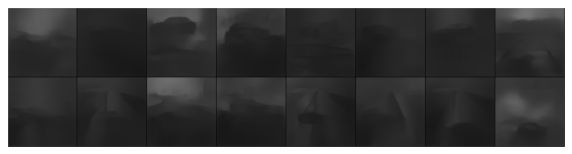

Depth


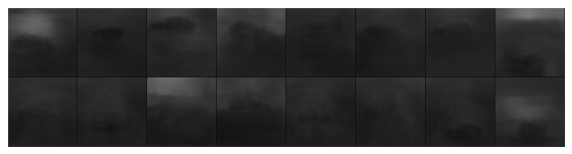

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


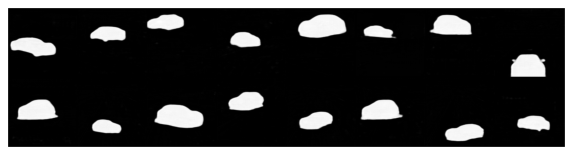

ground truth


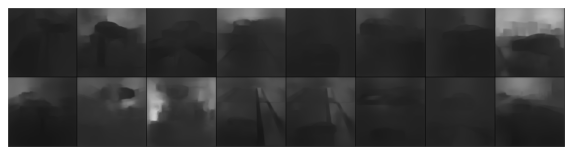

Depth


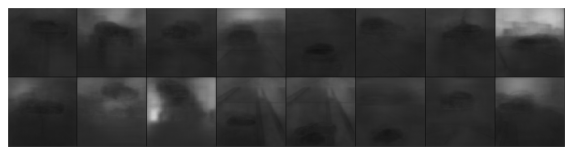

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


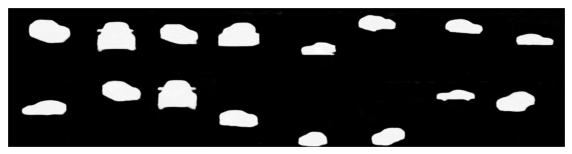

ground truth


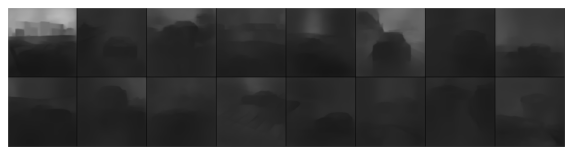

Depth


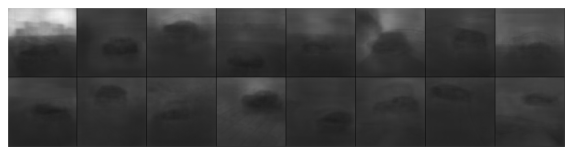

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


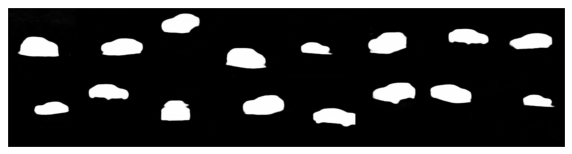

ground truth


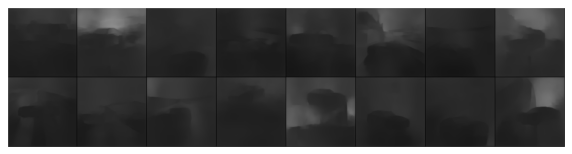

Depth


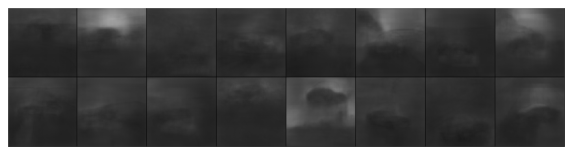

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


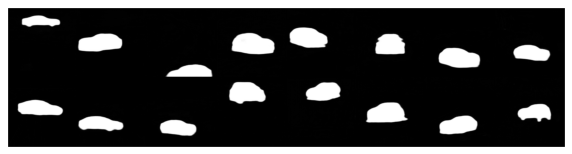

ground truth


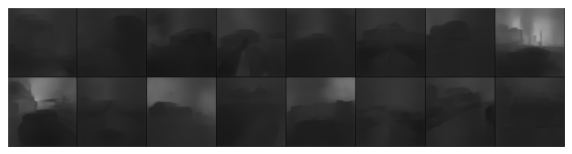

Depth


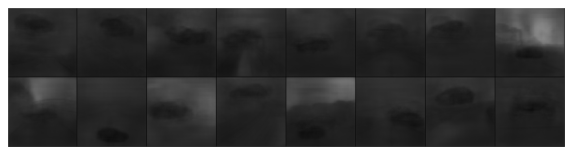

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


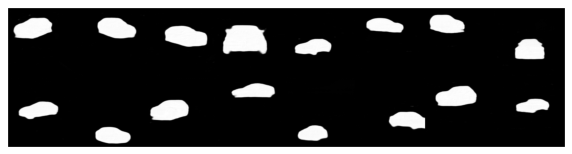

ground truth


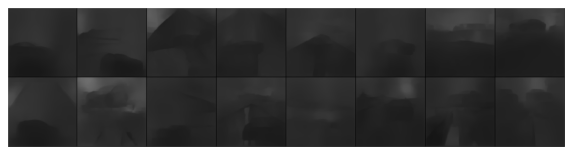

Depth


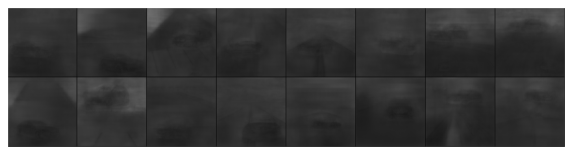

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


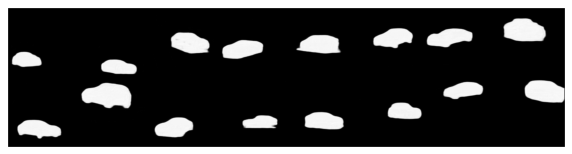

ground truth


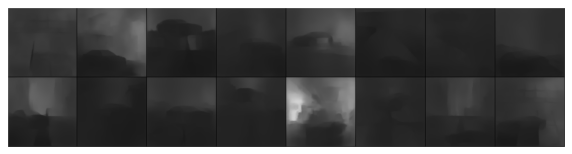

Depth


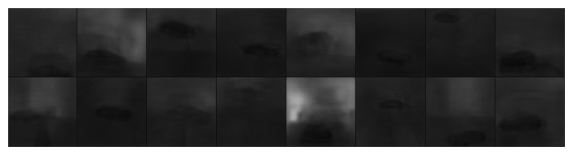

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mask


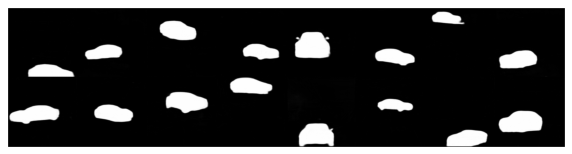

TypeError: ignored

In [69]:
train_net(model, device, train_loader, 2, 0.01)